# Final Presentation Analysis: AGOP and Grokking

Comprehensive analysis across all experiments:

| Experiment | Label | Dataset | Architecture | Weight Decays |
|------------|-------|---------|--------------|---------------|
| Nanda MLP | **Ia** | Modular Addition (Nanda) | MLP | 0.1, 1.0, 5.0, 10.0 |
| Nanda Transformer | **Ib** | Modular Addition (Nanda) | Transformer | 0.1, 1.0, 5.0, 10.0 |
| Softmax MLP | **IIa** | Modular Addition (Softmax) | MLP | 0.01, 0.1, 0.5, 1.0 |
| Softmax Transformer | **IIb** | Modular Addition (Softmax) | Transformer | 0.01, 0.1, 0.5, 1.0 |
| MNIST | **III** | MNIST Classification | MLP | 0.01, 0.1, 0.5, 1.0 |

For each experiment, we generate:
1. **Training Dynamics** (Train vs Test Accuracy)
2. **VCR Analysis** (Variation Collapse Ratio with normalized accuracy overlays)

Red dashed vertical lines indicate when test accuracy first reaches 80%.


In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings

sys.path.append(str(Path.cwd()))
from analysis_utils import (
    load_all_experiments, generate_summary_table, smooth_series
)

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 10

# Paths
NANDA_DIR = Path('../results/nanda')
SOFTMAX_DIR = Path('../results/softmax')
MNIST_DIR = Path('../results/mnist')
FIGURES_DIR = Path('./figures/final')
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

print(f"Figures will be saved to: {FIGURES_DIR.absolute()}")


Figures will be saved to: /net/vast-storage/scratch/vast/lhtsai/mabdel03/files/Classes/9.520/9.520-The-Geometry-of-Grok/New_Explorations/agop_experiments/analysis/figures/final


In [2]:
# Load all experiments
print("Loading experiments...")
nanda_experiments = load_all_experiments(NANDA_DIR)
softmax_experiments = load_all_experiments(SOFTMAX_DIR)
mnist_experiments = load_all_experiments(MNIST_DIR)

print(f"  Nanda: {len(nanda_experiments)} experiments")
print(f"  Softmax: {len(softmax_experiments)} experiments")
print(f"  MNIST: {len(mnist_experiments)} experiments")
print("Done!")


Loading experiments...
  Nanda: 24 experiments
  Softmax: 24 experiments
  MNIST: 12 experiments
Done!


In [3]:
# Helper functions

def normalize_series(series):
    """Normalize a series to [0, 1] range using min-max normalization."""
    s_min = np.min(series)
    s_max = np.max(series)
    if s_max - s_min < 1e-10:
        return np.zeros_like(series)
    return (series - s_min) / (s_max - s_min)

def find_test_80_epoch(test_acc, epochs):
    """Find the epoch when test accuracy first hits 0.80."""
    test_80_idx = np.where(test_acc >= 0.80)[0]
    return epochs[test_80_idx[0]] if len(test_80_idx) > 0 else None

def find_vcr_spike_epoch(vcr_values, epochs):
    """Find the epoch where VCR spikes highest."""
    if len(vcr_values) == 0:
        return None
    max_idx = np.argmax(vcr_values)
    return epochs[max_idx]

def get_epoch_metrics(experiments, arch, weight_decays, optimizers, architecture_field=True):
    """
    Extract epoch metrics for all weight decay / optimizer combinations.
    Returns dict with structure: {optimizer: {weight_decay: {'test_80_epoch': ..., 'vcr_spike_epoch': ...}}}
    """
    results = {opt: {} for opt in optimizers}
    
    for wd in weight_decays:
        for opt in optimizers:
            if architecture_field:
                exp_data = get_experiment_by_config(experiments, architecture=arch, optimizer=opt, weight_decay=wd)
            else:
                exp_data = get_experiment_by_config(experiments, optimizer=opt, weight_decay=wd)
            
            if exp_data is None:
                results[opt][wd] = {'test_80_epoch': None, 'vcr_spike_epoch': None}
                continue
            
            history = exp_data.get('history', {})
            agop = exp_data.get('agop', {})
            
            # Get epochs array
            if 'test_acc' not in history:
                results[opt][wd] = {'test_80_epoch': None, 'vcr_spike_epoch': None}
                continue
                
            epochs = np.array(history.get('epoch', range(len(history['test_acc']))))
            test_acc = np.array(history['test_acc'])
            
            # Find test 80% epoch
            test_80_epoch = find_test_80_epoch(test_acc, epochs)
            
            # Find VCR spike epoch
            vcr_spike_epoch = None
            if 'agop_variation_collapse_ratio' in agop:
                vcr_values = np.array(agop['agop_variation_collapse_ratio'])
                min_len = min(len(epochs), len(vcr_values))
                vcr_spike_epoch = find_vcr_spike_epoch(vcr_values[:min_len], epochs[:min_len])
            
            results[opt][wd] = {
                'test_80_epoch': test_80_epoch,
                'vcr_spike_epoch': vcr_spike_epoch
            }
    
    return results


def plot_wd_vs_epochs(experiments, arch, weight_decays, optimizers, exp_label, exp_name, 
                      architecture_field=True):
    """
    Generate 2x2 panel:
    - Top row: absolute epoch values
    - Bottom row: log(epoch) values
    - Left column: epoch to 80% test accuracy
    - Right column: epoch of VCR peak
    Discontinuities (phenomenon doesn't occur) marked with 'x' marker.
    """
    results = get_epoch_metrics(experiments, arch, weight_decays, optimizers, architecture_field)
    
    colors = {'adamw': 'blue', 'muon': 'green', 'sgd': 'orange'}
    markers = {'adamw': 'o', 'muon': 's', 'sgd': '^'}
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Helper to plot with discontinuities
    def plot_with_discontinuities(ax, results, optimizers, weight_decays, metric_key, use_log=False):
        for opt in optimizers:
            # Separate valid and invalid points
            valid_wd = []
            valid_epoch = []
            invalid_wd = []
            
            for wd in weight_decays:
                epoch_val = results[opt][wd][metric_key]
                if epoch_val is not None:
                    valid_wd.append(wd)
                    if use_log:
                        valid_epoch.append(np.log10(max(epoch_val, 1)))
                    else:
                        valid_epoch.append(epoch_val)
                else:
                    invalid_wd.append(wd)
            
            # Plot valid points with lines
            if len(valid_wd) > 0:
                ax.plot(valid_wd, valid_epoch, color=colors[opt], marker=markers[opt], 
                       linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
            
            # Plot invalid points as 'x' at top of y-axis (will be set after all data plotted)
            if len(invalid_wd) > 0:
                # Store for later plotting at y_max
                if not hasattr(ax, '_invalid_points'):
                    ax._invalid_points = []
                ax._invalid_points.append((invalid_wd, colors[opt], opt.upper()))
    
    # Top-left: Absolute epoch to 80% test acc
    ax = axes[0, 0]
    plot_with_discontinuities(ax, results, optimizers, weight_decays, 'test_80_epoch', use_log=False)
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('Epoch to 80% Test Acc', fontsize=10)
    ax.set_title('Epoch to 80% Test Accuracy (Absolute)', fontsize=11, fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)
    ax.set_xscale('log')
    # Plot discontinuities at top
    if hasattr(ax, '_invalid_points'):
        y_max = ax.get_ylim()[1]
        for invalid_wd, color, label in ax._invalid_points:
            ax.scatter(invalid_wd, [y_max * 0.95] * len(invalid_wd), color=color, marker='x', s=100, linewidths=2, zorder=5)
    
    # Top-right: Absolute epoch of VCR peak
    ax = axes[0, 1]
    plot_with_discontinuities(ax, results, optimizers, weight_decays, 'vcr_spike_epoch', use_log=False)
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('Epoch of VCR Peak', fontsize=10)
    ax.set_title('Epoch of VCR Peak (Absolute)', fontsize=11, fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)
    ax.set_xscale('log')
    if hasattr(ax, '_invalid_points'):
        y_max = ax.get_ylim()[1]
        for invalid_wd, color, label in ax._invalid_points:
            ax.scatter(invalid_wd, [y_max * 0.95] * len(invalid_wd), color=color, marker='x', s=100, linewidths=2, zorder=5)
    
    # Bottom-left: Log epoch to 80% test acc
    ax = axes[1, 0]
    plot_with_discontinuities(ax, results, optimizers, weight_decays, 'test_80_epoch', use_log=True)
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('log₁₀(Epoch to 80% Test Acc)', fontsize=10)
    ax.set_title('Epoch to 80% Test Accuracy (Log Scale)', fontsize=11, fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)
    ax.set_xscale('log')
    if hasattr(ax, '_invalid_points'):
        y_max = ax.get_ylim()[1]
        for invalid_wd, color, label in ax._invalid_points:
            ax.scatter(invalid_wd, [y_max * 0.95] * len(invalid_wd), color=color, marker='x', s=100, linewidths=2, zorder=5)
    
    # Bottom-right: Log epoch of VCR peak
    ax = axes[1, 1]
    plot_with_discontinuities(ax, results, optimizers, weight_decays, 'vcr_spike_epoch', use_log=True)
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('log₁₀(Epoch of VCR Peak)', fontsize=10)
    ax.set_title('Epoch of VCR Peak (Log Scale)', fontsize=11, fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)
    ax.set_xscale('log')
    if hasattr(ax, '_invalid_points'):
        y_max = ax.get_ylim()[1]
        for invalid_wd, color, label in ax._invalid_points:
            ax.scatter(invalid_wd, [y_max * 0.95] * len(invalid_wd), color=color, marker='x', s=100, linewidths=2, zorder=5)
    
    fig.suptitle(f'{exp_label}: Weight Decay vs Epoch Analysis', fontsize=12, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    save_name = f'{exp_label}_{exp_name}_wd_epoch_analysis.png'
    plt.savefig(FIGURES_DIR / save_name, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Generated: {save_name}")

def get_experiment_by_config(experiments, architecture=None, optimizer=None, weight_decay=None):
    """Find experiment matching the given configuration."""
    for name, data in experiments.items():
        config = data['config']
        if architecture is not None and config.get('architecture') != architecture:
            continue
        if optimizer is not None and config.get('optimizer') != optimizer:
            continue
        if weight_decay is not None and abs(config.get('weight_decay', 0) - weight_decay) > 0.01:
            continue
        return data
    return None

print("Helper functions loaded.")


Helper functions loaded.


---
# Experiment Ia: Nanda MLP

Modular addition task using Nanda's formulation with MLP architecture.


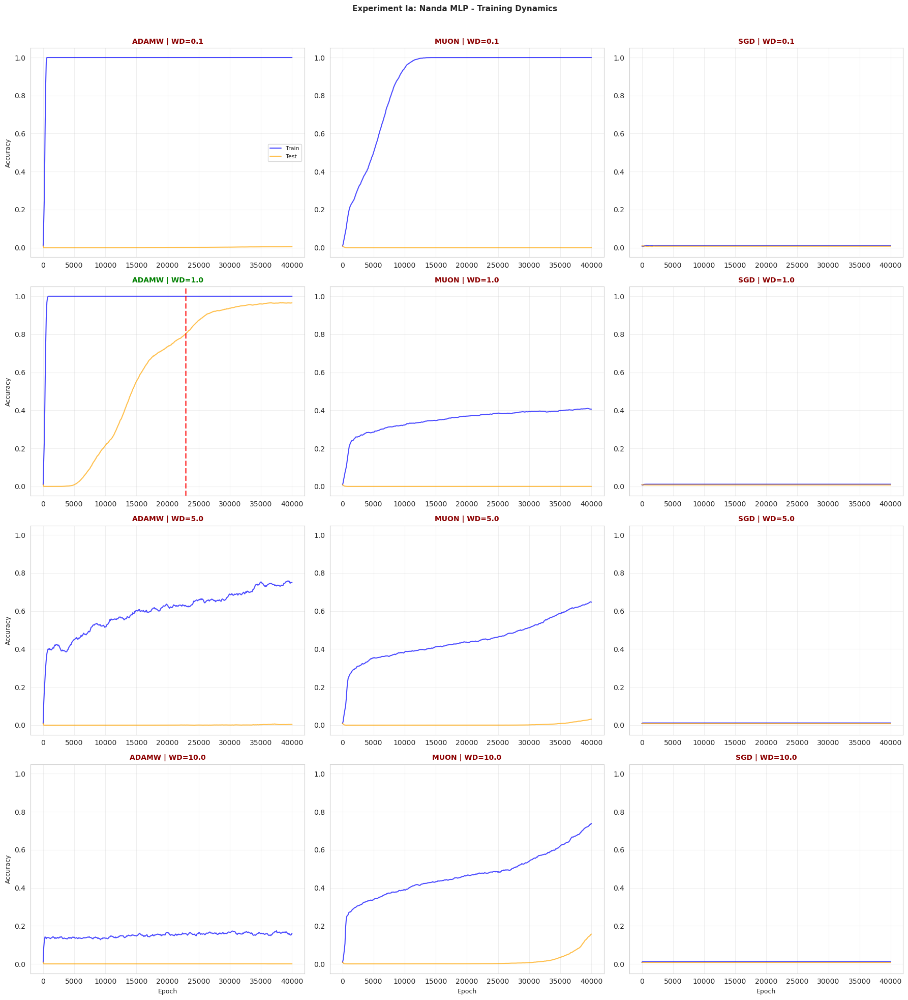

Generated: Ia_nanda_mlp_training_dynamics.png


In [4]:
# Experiment Ia: Nanda MLP - Training Dynamics
arch = 'mlp'
weight_decays = [0.1, 1.0, 5.0, 10.0]
optimizers = ['adamw', 'muon', 'sgd']

fig, axes = plt.subplots(4, 3, figsize=(18, 20))

for wd_idx, wd in enumerate(weight_decays):
    for opt_idx, opt in enumerate(optimizers):
        ax = axes[wd_idx, opt_idx]
        
        exp_data = get_experiment_by_config(nanda_experiments, architecture=arch, optimizer=opt, weight_decay=wd)
        
        if exp_data is None or 'train_acc' not in exp_data.get('history', {}):
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10)
            continue
        
        history = exp_data['history']
        epochs = np.array(history.get('epoch', range(len(history['train_acc']))))
        train_acc = np.array(history['train_acc'])
        test_acc = np.array(history['test_acc'])
        
        test_80_epoch = find_test_80_epoch(test_acc, epochs)
        
        ax.plot(epochs, train_acc, 'b-', linewidth=1.5, label='Train', alpha=0.7)
        ax.plot(epochs, test_acc, 'orange', linewidth=1.5, label='Test', alpha=0.7)
        
        if test_80_epoch is not None:
            ax.axvline(x=test_80_epoch, color='red', linestyle='--', linewidth=2, alpha=0.7)
            status_color = 'green'
        else:
            status_color = 'darkred'
        
        ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10, fontweight='bold', color=status_color)
        if wd_idx == 3:
            ax.set_xlabel('Epoch', fontsize=9)
        if opt_idx == 0:
            ax.set_ylabel('Accuracy', fontsize=9)
        if wd_idx == 0 and opt_idx == 0:
            ax.legend(fontsize=8, loc='best')
        ax.grid(alpha=0.3)
        ax.set_ylim([-0.05, 1.05])

fig.suptitle('Experiment Ia: Nanda MLP - Training Dynamics', fontsize=11, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig(FIGURES_DIR / 'Ia_nanda_mlp_training_dynamics.png', dpi=300, bbox_inches='tight')
plt.show()
print("Generated: Ia_nanda_mlp_training_dynamics.png")


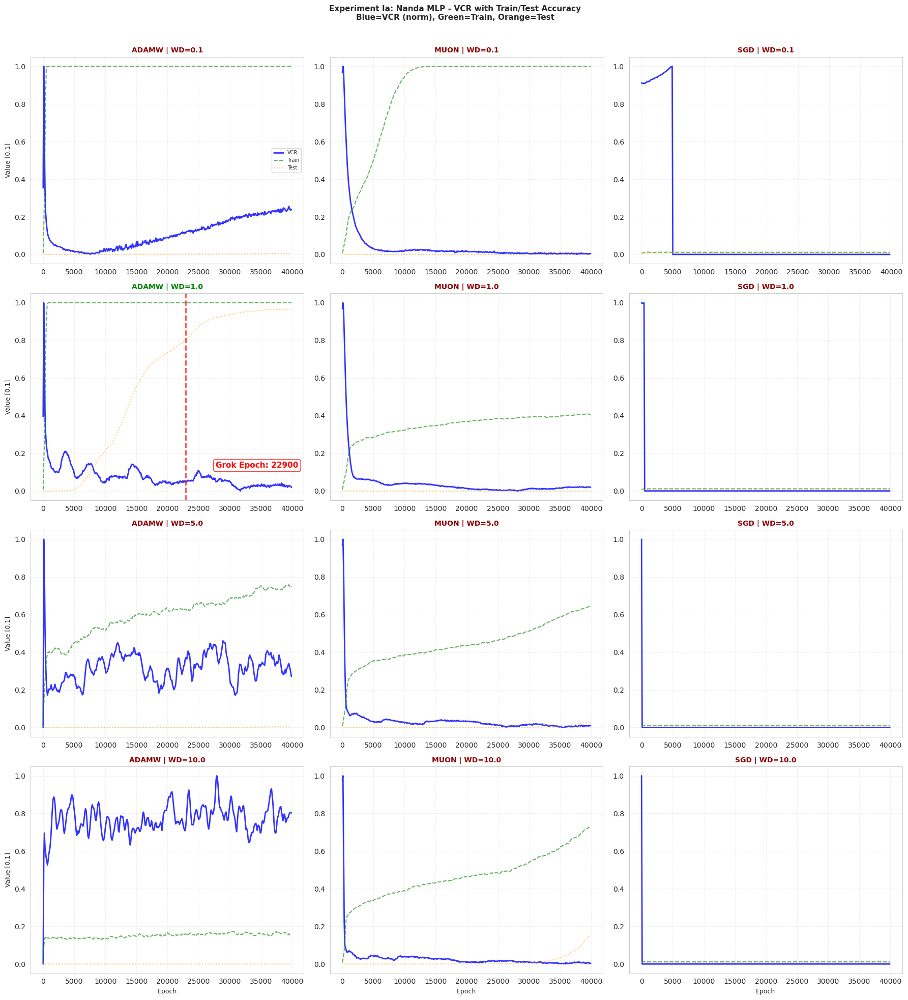

Generated: Ia_nanda_mlp_vcr.png


In [5]:
# Experiment Ia: Nanda MLP - VCR Analysis
arch = 'mlp'
weight_decays = [0.1, 1.0, 5.0, 10.0]
optimizers = ['adamw', 'muon', 'sgd']
metric_name = 'agop_variation_collapse_ratio'
metric_label = 'VCR'

fig, axes = plt.subplots(4, 3, figsize=(18, 20))

for wd_idx, wd in enumerate(weight_decays):
    for opt_idx, opt in enumerate(optimizers):
        ax = axes[wd_idx, opt_idx]
        
        exp_data = get_experiment_by_config(nanda_experiments, architecture=arch, optimizer=opt, weight_decay=wd)
        
        if exp_data is None or metric_name not in exp_data.get('agop', {}):
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10)
            continue
        
        history = exp_data['history']
        agop = exp_data.get('agop', {})
        
        if 'train_acc' not in history or 'test_acc' not in history:
            ax.text(0.5, 0.5, 'Missing data', ha='center', va='center', transform=ax.transAxes)
            continue
        
        epochs = np.array(history.get('epoch', range(len(history['test_acc']))))
        metric_values = np.array(agop[metric_name])
        train_acc = np.array(history['train_acc'])
        test_acc = np.array(history['test_acc'])
        
        min_len = min(len(epochs), len(metric_values), len(train_acc), len(test_acc))
        epochs = epochs[:min_len]
        metric_values = metric_values[:min_len]
        train_acc = train_acc[:min_len]
        test_acc = test_acc[:min_len]
        
        test_80_epoch = find_test_80_epoch(test_acc, epochs)
        metric_norm = normalize_series(metric_values)
        
        ax.plot(epochs, metric_norm, linewidth=2, color='blue', alpha=0.8, label=metric_label, linestyle='-')
        ax.plot(epochs, train_acc, linewidth=1.5, color='green', alpha=0.6, label='Train', linestyle='--')
        ax.plot(epochs, test_acc, linewidth=1.5, color='orange', alpha=0.6, label='Test', linestyle=':')
        
        if test_80_epoch is not None:
            ax.axvline(x=test_80_epoch, color='red', linestyle='--', linewidth=2, alpha=0.7)
            # Add Grok Epoch label
            ax.text(0.98, 0.15, f'Grok Epoch: {int(test_80_epoch)}', transform=ax.transAxes,
                   fontsize=11, fontweight='bold', color='red', ha='right', va='bottom',
                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='red'))
            status_color = 'green'
        else:
            status_color = 'darkred'
        
        ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10, fontweight='bold', color=status_color)
        ax.grid(alpha=0.3, linestyle='--')
        ax.set_ylim([-0.05, 1.05])
        if wd_idx == 3:
            ax.set_xlabel('Epoch', fontsize=9)
        if opt_idx == 0:
            ax.set_ylabel('Value [0,1]', fontsize=9)
        if wd_idx == 0 and opt_idx == 0:
            ax.legend(fontsize=7, loc='best')

fig.suptitle('Experiment Ia: Nanda MLP - VCR with Train/Test Accuracy\nBlue=VCR (norm), Green=Train, Orange=Test', 
            fontsize=11, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig(FIGURES_DIR / 'Ia_nanda_mlp_vcr.png', dpi=300, bbox_inches='tight')
plt.show()
print("Generated: Ia_nanda_mlp_vcr.png")


---
# Experiment Ib: Nanda Transformer

Modular addition task using Nanda's formulation with Transformer architecture.


In [6]:
# Reusable plotting functions for all experiments

def plot_training_dynamics(experiments, arch, weight_decays, optimizers, title, save_name, architecture_field=True):
    """Generate training dynamics panel for an experiment."""
    fig, axes = plt.subplots(4, 3, figsize=(18, 20))
    
    for wd_idx, wd in enumerate(weight_decays):
        for opt_idx, opt in enumerate(optimizers):
            ax = axes[wd_idx, opt_idx]
            
            if architecture_field:
                exp_data = get_experiment_by_config(experiments, architecture=arch, optimizer=opt, weight_decay=wd)
            else:
                exp_data = get_experiment_by_config(experiments, optimizer=opt, weight_decay=wd)
            
            if exp_data is None or 'train_acc' not in exp_data.get('history', {}):
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10)
                continue
            
            history = exp_data['history']
            epochs = np.array(history.get('epoch', range(len(history['train_acc']))))
            train_acc = np.array(history['train_acc'])
            test_acc = np.array(history['test_acc'])
            
            test_80_epoch = find_test_80_epoch(test_acc, epochs)
            
            ax.plot(epochs, train_acc, 'b-', linewidth=1.5, label='Train', alpha=0.7)
            ax.plot(epochs, test_acc, 'orange', linewidth=1.5, label='Test', alpha=0.7)
            
            if test_80_epoch is not None:
                ax.axvline(x=test_80_epoch, color='red', linestyle='--', linewidth=2, alpha=0.7)
                status_color = 'green'
            else:
                status_color = 'darkred'
            
            ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10, fontweight='bold', color=status_color)
            if wd_idx == 3:
                ax.set_xlabel('Epoch', fontsize=9)
            if opt_idx == 0:
                ax.set_ylabel('Accuracy', fontsize=9)
            if wd_idx == 0 and opt_idx == 0:
                ax.legend(fontsize=8, loc='best')
            ax.grid(alpha=0.3)
            ax.set_ylim([-0.05, 1.05])
    
    fig.suptitle(title, fontsize=11, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(FIGURES_DIR / save_name, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Generated: {save_name}")


def plot_vcr_analysis(experiments, arch, weight_decays, optimizers, title, save_name, architecture_field=True):
    """Generate VCR analysis panel for an experiment."""
    metric_name = 'agop_variation_collapse_ratio'
    metric_label = 'VCR'
    
    fig, axes = plt.subplots(4, 3, figsize=(18, 20))
    
    for wd_idx, wd in enumerate(weight_decays):
        for opt_idx, opt in enumerate(optimizers):
            ax = axes[wd_idx, opt_idx]
            
            if architecture_field:
                exp_data = get_experiment_by_config(experiments, architecture=arch, optimizer=opt, weight_decay=wd)
            else:
                exp_data = get_experiment_by_config(experiments, optimizer=opt, weight_decay=wd)
            
            if exp_data is None or metric_name not in exp_data.get('agop', {}):
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10)
                continue
            
            history = exp_data['history']
            agop = exp_data.get('agop', {})
            
            if 'train_acc' not in history or 'test_acc' not in history:
                ax.text(0.5, 0.5, 'Missing data', ha='center', va='center', transform=ax.transAxes)
                continue
            
            epochs = np.array(history.get('epoch', range(len(history['test_acc']))))
            metric_values = np.array(agop[metric_name])
            train_acc = np.array(history['train_acc'])
            test_acc = np.array(history['test_acc'])
            
            min_len = min(len(epochs), len(metric_values), len(train_acc), len(test_acc))
            epochs = epochs[:min_len]
            metric_values = metric_values[:min_len]
            train_acc = train_acc[:min_len]
            test_acc = test_acc[:min_len]
            
            test_80_epoch = find_test_80_epoch(test_acc, epochs)
            metric_norm = normalize_series(metric_values)
            
            ax.plot(epochs, metric_norm, linewidth=2, color='blue', alpha=0.8, label=metric_label, linestyle='-')
            ax.plot(epochs, train_acc, linewidth=1.5, color='green', alpha=0.6, label='Train', linestyle='--')
            ax.plot(epochs, test_acc, linewidth=1.5, color='orange', alpha=0.6, label='Test', linestyle=':')
            
            if test_80_epoch is not None:
                ax.axvline(x=test_80_epoch, color='red', linestyle='--', linewidth=2, alpha=0.7)
                # Add Grok Epoch label
                ax.text(0.98, 0.15, f'Grok Epoch: {int(test_80_epoch)}', transform=ax.transAxes,
                       fontsize=11, fontweight='bold', color='red', ha='right', va='bottom',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='red'))
                status_color = 'green'
            else:
                status_color = 'darkred'
            
            ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10, fontweight='bold', color=status_color)
            ax.grid(alpha=0.3, linestyle='--')
            ax.set_ylim([-0.05, 1.05])
            if wd_idx == 3:
                ax.set_xlabel('Epoch', fontsize=9)
            if opt_idx == 0:
                ax.set_ylabel('Value [0,1]', fontsize=9)
            if wd_idx == 0 and opt_idx == 0:
                ax.legend(fontsize=7, loc='best')
    
    fig.suptitle(title, fontsize=11, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(FIGURES_DIR / save_name, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Generated: {save_name}")

print("Plotting functions defined.")


Plotting functions defined.


Experiment Ib: Nanda Transformer


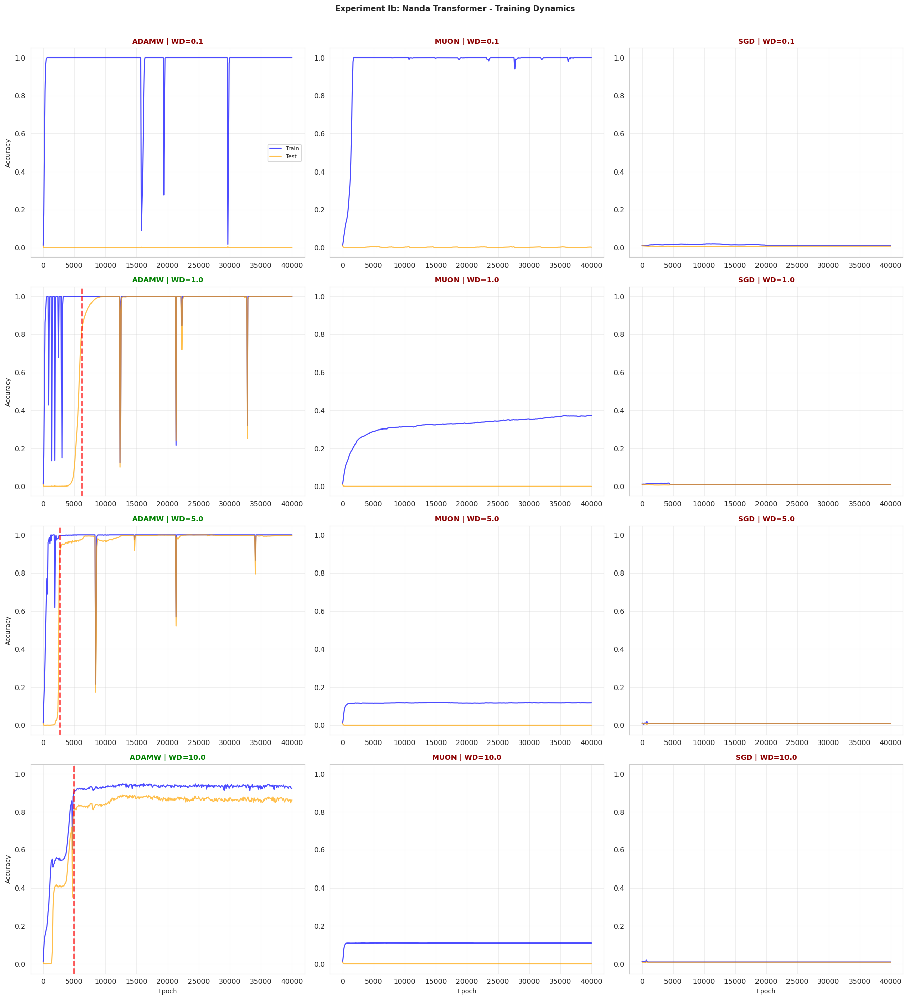

Generated: Ib_nanda_transformer_training_dynamics.png


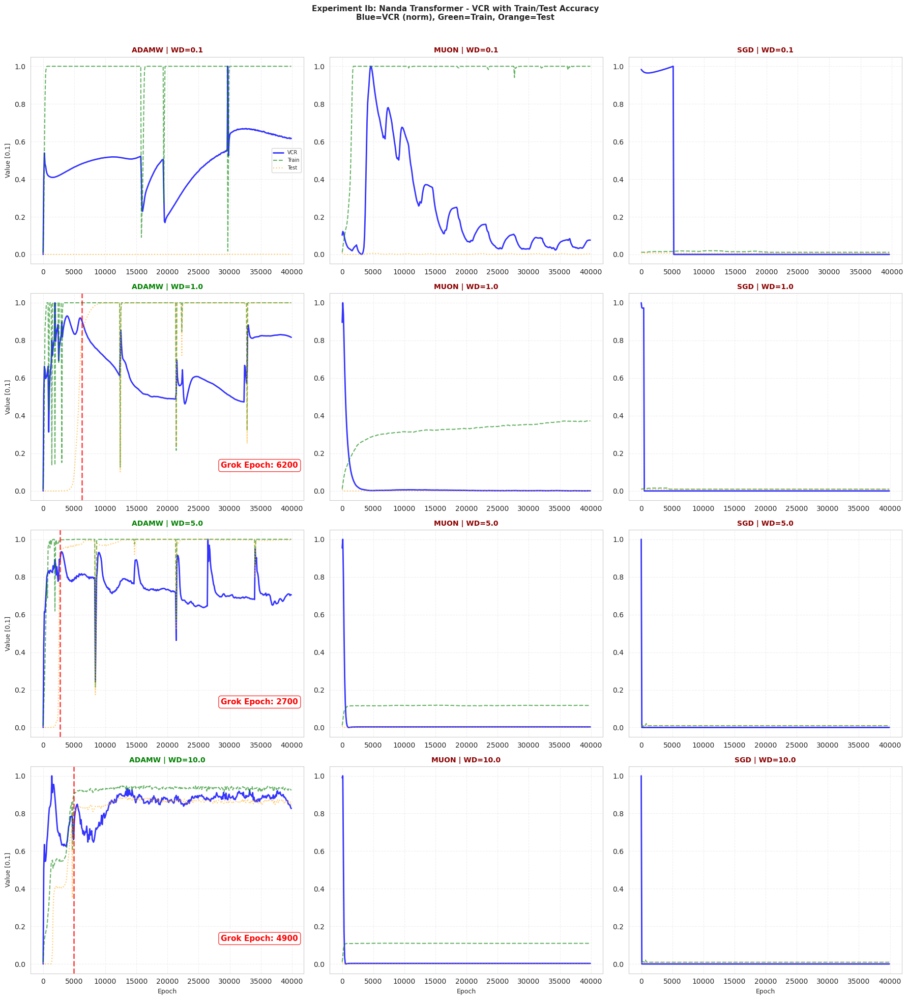

Generated: Ib_nanda_transformer_vcr.png


In [7]:
# Experiment Ib: Nanda Transformer
print("="*80)
print("Experiment Ib: Nanda Transformer")
print("="*80)

plot_training_dynamics(
    nanda_experiments, 'transformer', [0.1, 1.0, 5.0, 10.0], ['adamw', 'muon', 'sgd'],
    'Experiment Ib: Nanda Transformer - Training Dynamics',
    'Ib_nanda_transformer_training_dynamics.png'
)

plot_vcr_analysis(
    nanda_experiments, 'transformer', [0.1, 1.0, 5.0, 10.0], ['adamw', 'muon', 'sgd'],
    'Experiment Ib: Nanda Transformer - VCR with Train/Test Accuracy\nBlue=VCR (norm), Green=Train, Orange=Test',
    'Ib_nanda_transformer_vcr.png'
)


Experiment IIa: Softmax MLP


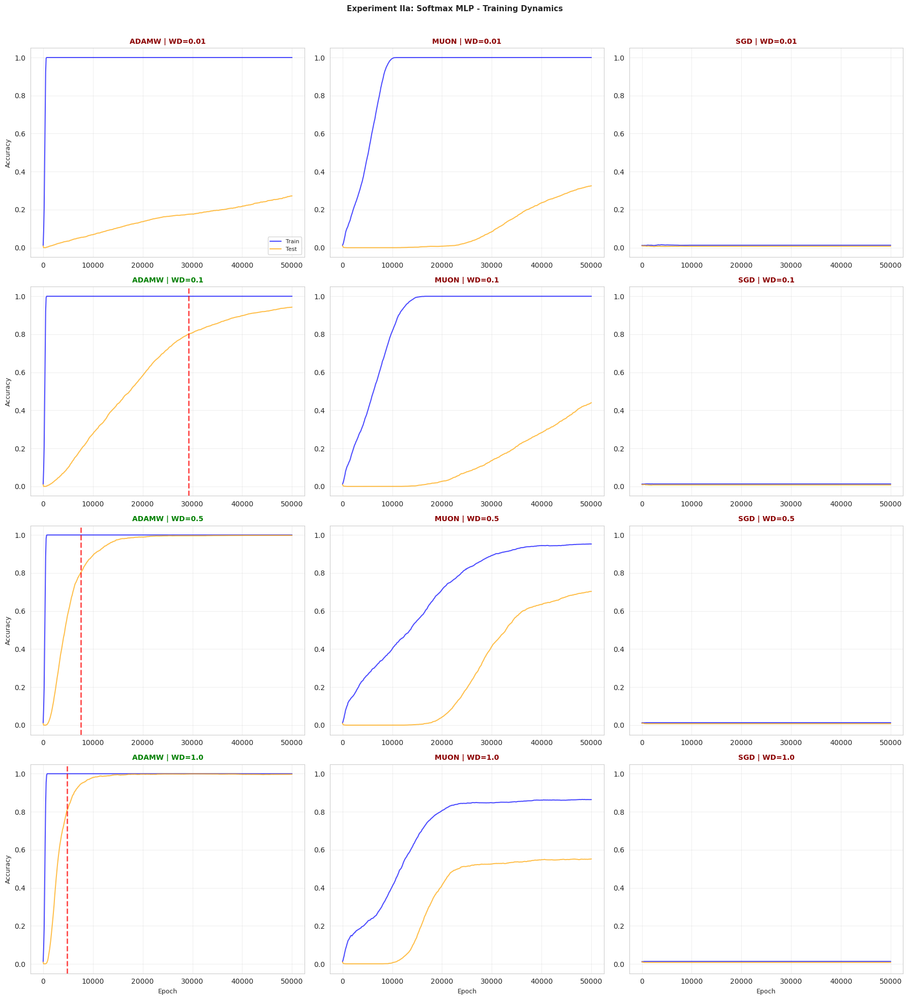

Generated: IIa_softmax_mlp_training_dynamics.png


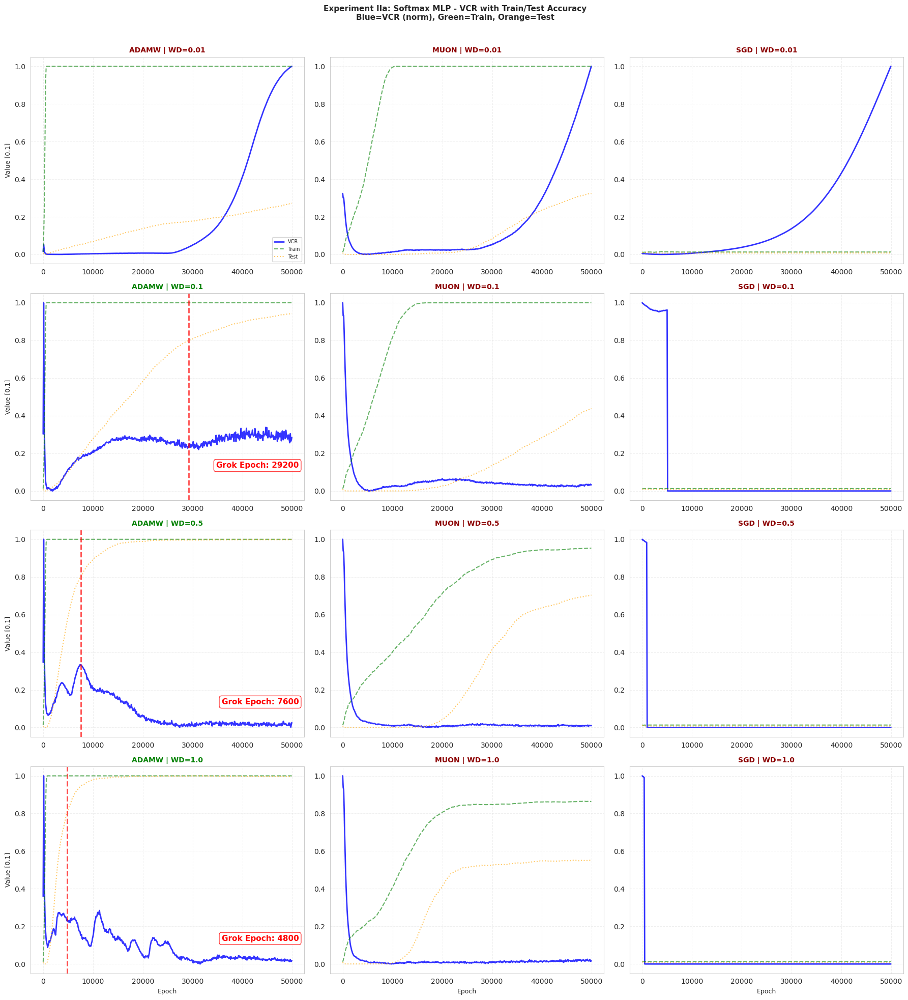

Generated: IIa_softmax_mlp_vcr.png


In [8]:
# Experiment IIa: Softmax MLP
print("="*80)
print("Experiment IIa: Softmax MLP")
print("="*80)

plot_training_dynamics(
    softmax_experiments, 'mlp', [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'Experiment IIa: Softmax MLP - Training Dynamics',
    'IIa_softmax_mlp_training_dynamics.png'
)

plot_vcr_analysis(
    softmax_experiments, 'mlp', [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'Experiment IIa: Softmax MLP - VCR with Train/Test Accuracy\nBlue=VCR (norm), Green=Train, Orange=Test',
    'IIa_softmax_mlp_vcr.png'
)


Experiment IIb: Softmax Transformer


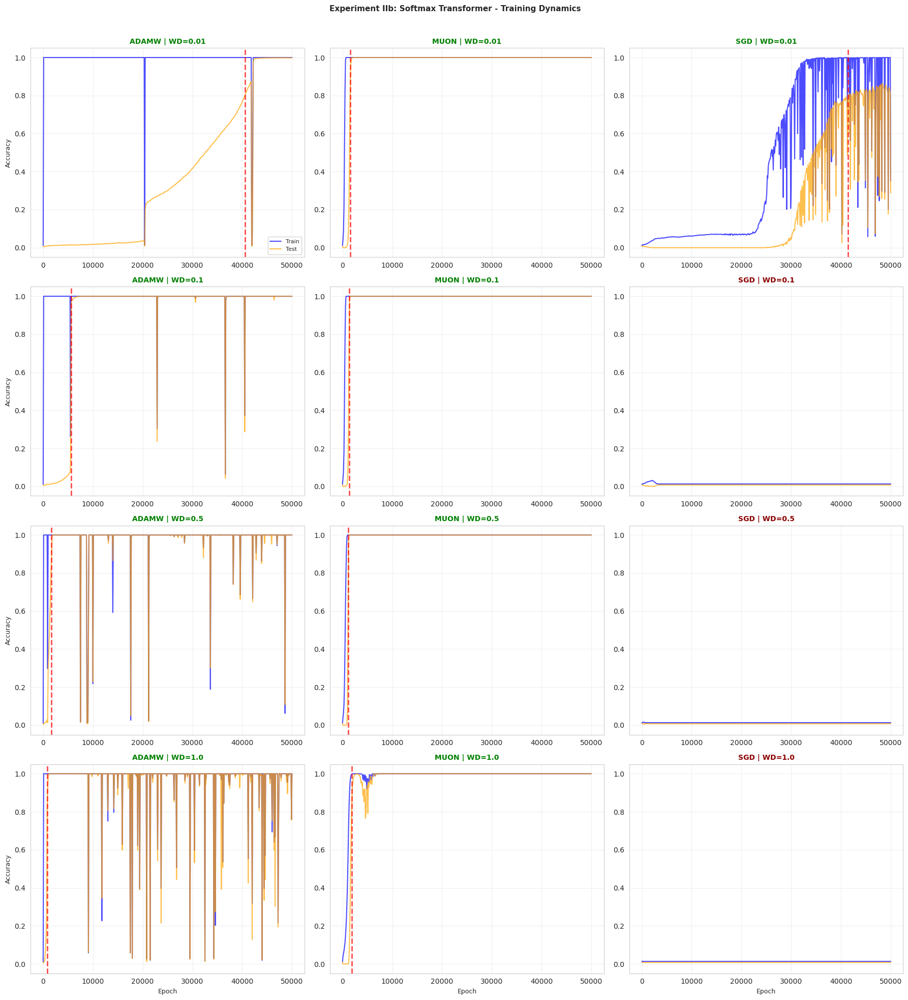

Generated: IIb_softmax_transformer_training_dynamics.png


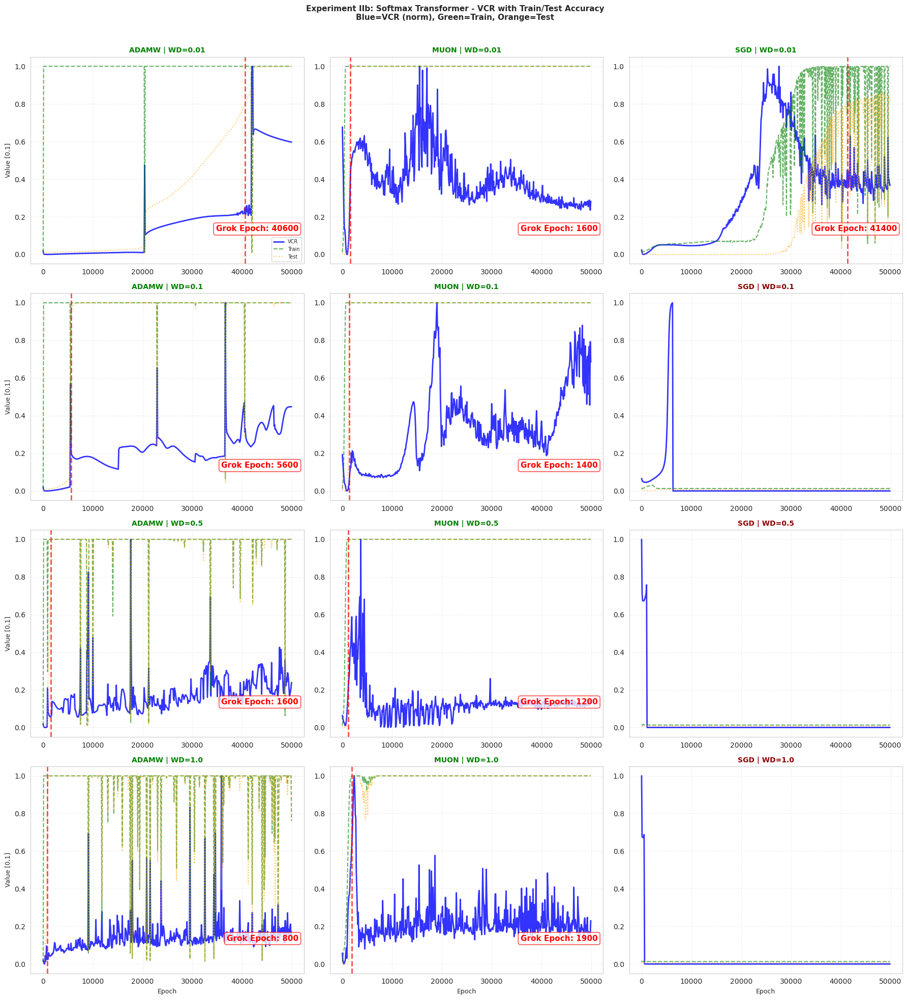

Generated: IIb_softmax_transformer_vcr.png


In [9]:
# Experiment IIb: Softmax Transformer
print("="*80)
print("Experiment IIb: Softmax Transformer")
print("="*80)

plot_training_dynamics(
    softmax_experiments, 'transformer', [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'Experiment IIb: Softmax Transformer - Training Dynamics',
    'IIb_softmax_transformer_training_dynamics.png'
)

plot_vcr_analysis(
    softmax_experiments, 'transformer', [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'Experiment IIb: Softmax Transformer - VCR with Train/Test Accuracy\nBlue=VCR (norm), Green=Train, Orange=Test',
    'IIb_softmax_transformer_vcr.png'
)


Experiment III: MNIST


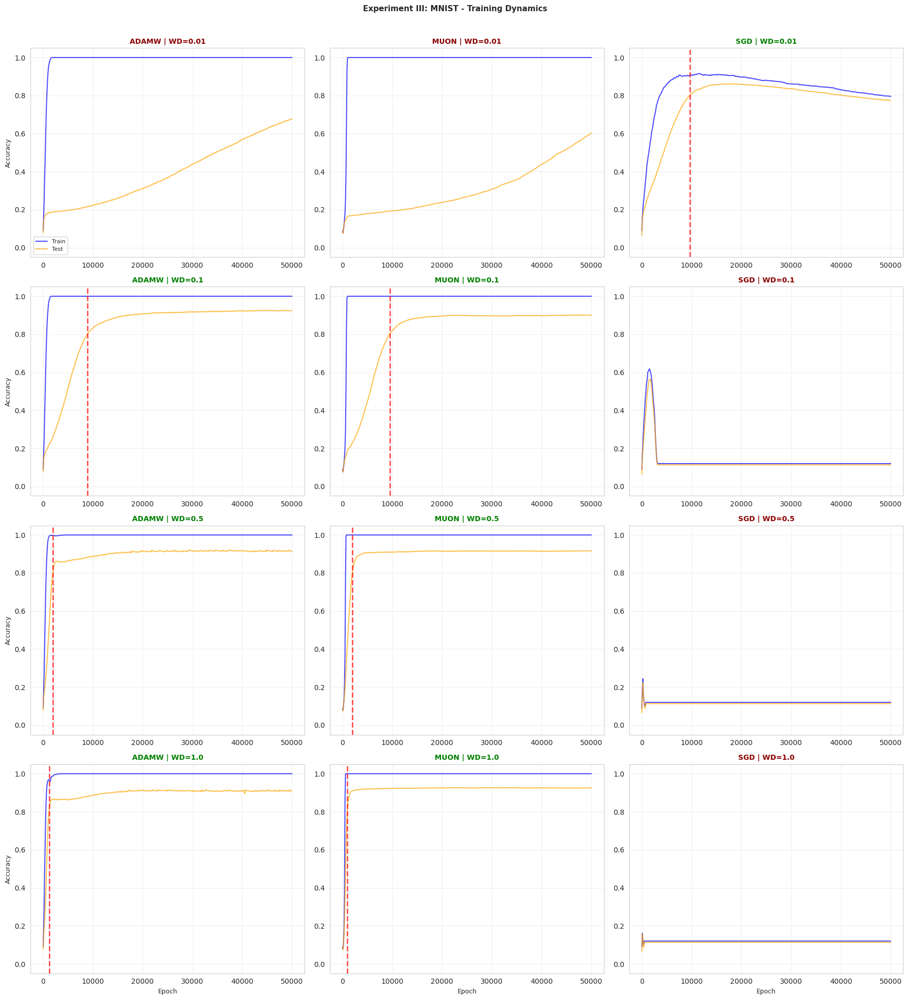

Generated: III_mnist_training_dynamics.png


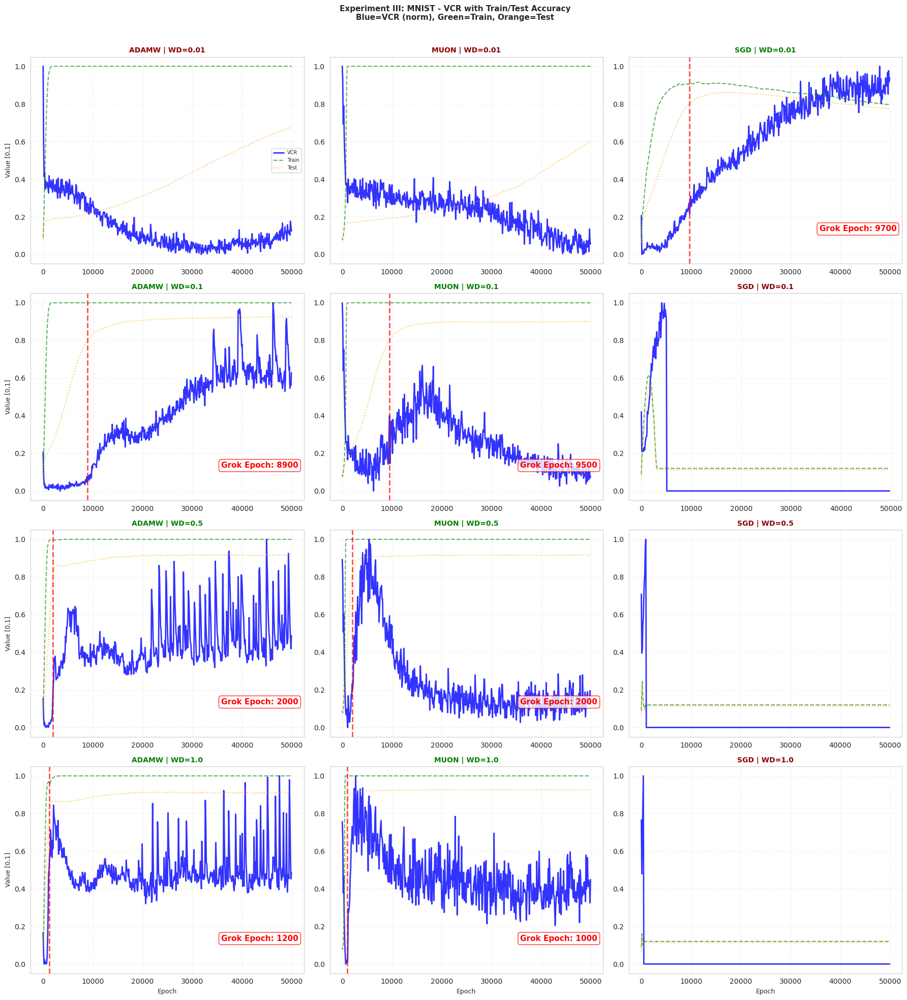

Generated: III_mnist_vcr.png


In [10]:
# Experiment III: MNIST
print("="*80)
print("Experiment III: MNIST")
print("="*80)

# MNIST has no architecture field
plot_training_dynamics(
    mnist_experiments, None, [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'Experiment III: MNIST - Training Dynamics',
    'III_mnist_training_dynamics.png',
    architecture_field=False
)

plot_vcr_analysis(
    mnist_experiments, None, [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'Experiment III: MNIST - VCR with Train/Test Accuracy\nBlue=VCR (norm), Green=Train, Orange=Test',
    'III_mnist_vcr.png',
    architecture_field=False
)


In [11]:
print("="*80)
print("FINAL PRESENTATION ANALYSIS COMPLETE")
print("="*80)
print(f"\nGenerated 10 figures total:")
print(f"  - 5 Training Dynamics panels (one per experiment)")
print(f"  - 5 VCR Analysis panels (one per experiment)")
print(f"\nExperiment Labels:")
print(f"  Ia  = Nanda MLP")
print(f"  Ib  = Nanda Transformer")
print(f"  IIa = Softmax MLP")
print(f"  IIb = Softmax Transformer")
print(f"  III = MNIST")
print(f"\nAll figures saved to: {FIGURES_DIR.absolute()}")
print("="*80)


FINAL PRESENTATION ANALYSIS COMPLETE

Generated 10 figures total:
  - 5 Training Dynamics panels (one per experiment)
  - 5 VCR Analysis panels (one per experiment)

Experiment Labels:
  Ia  = Nanda MLP
  Ib  = Nanda Transformer
  IIa = Softmax MLP
  IIb = Softmax Transformer
  III = MNIST

All figures saved to: /net/vast-storage/scratch/vast/lhtsai/mabdel03/files/Classes/9.520/9.520-The-Geometry-of-Grok/New_Explorations/agop_experiments/analysis/figures/final


---
# Weight Decay vs Epoch Analysis

For each experiment, we generate two plots:
1. **Weight Decay vs log(Epoch to 80% Test Accuracy)** - Shows how weight decay affects time to generalization
2. **Weight Decay vs log(Epoch of VCR Peak)** - Shows when the Variation Collapse Ratio spikes highest

If test accuracy never reaches 80%, we use epoch=1 (log=0) as a placeholder.


Weight Decay vs Epoch Analysis


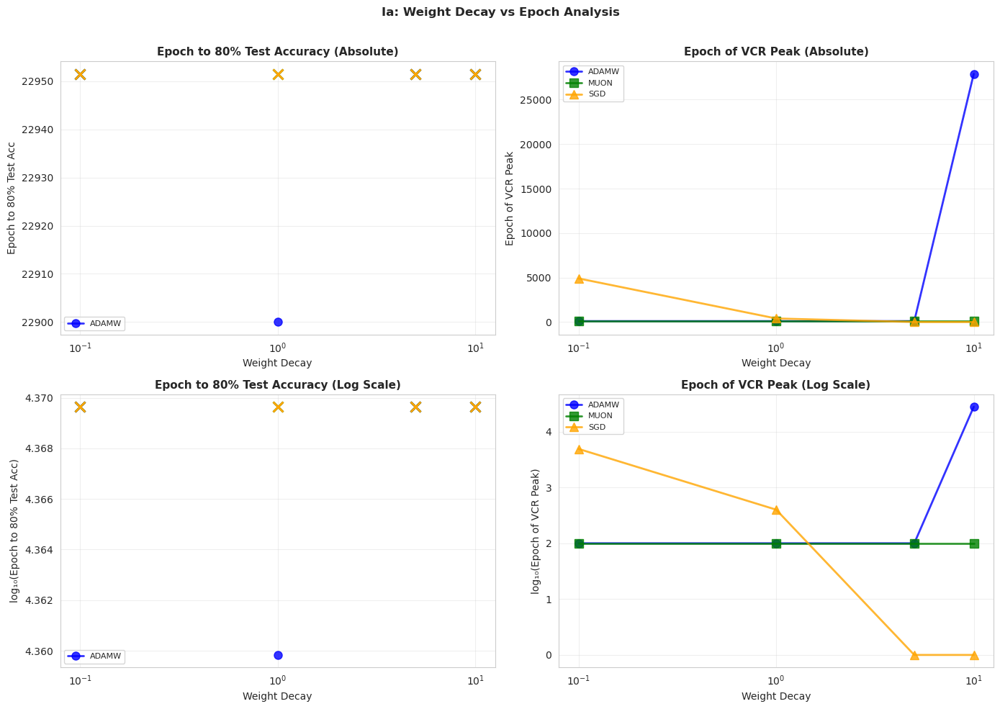

Generated: Ia_nanda_mlp_wd_epoch_analysis.png


In [12]:
# Experiment Ia: Nanda MLP - WD vs Epoch Analysis
print("="*80)
print("Weight Decay vs Epoch Analysis")
print("="*80)

plot_wd_vs_epochs(
    nanda_experiments, 'mlp', [0.1, 1.0, 5.0, 10.0], ['adamw', 'muon', 'sgd'],
    'Ia', 'nanda_mlp'
)


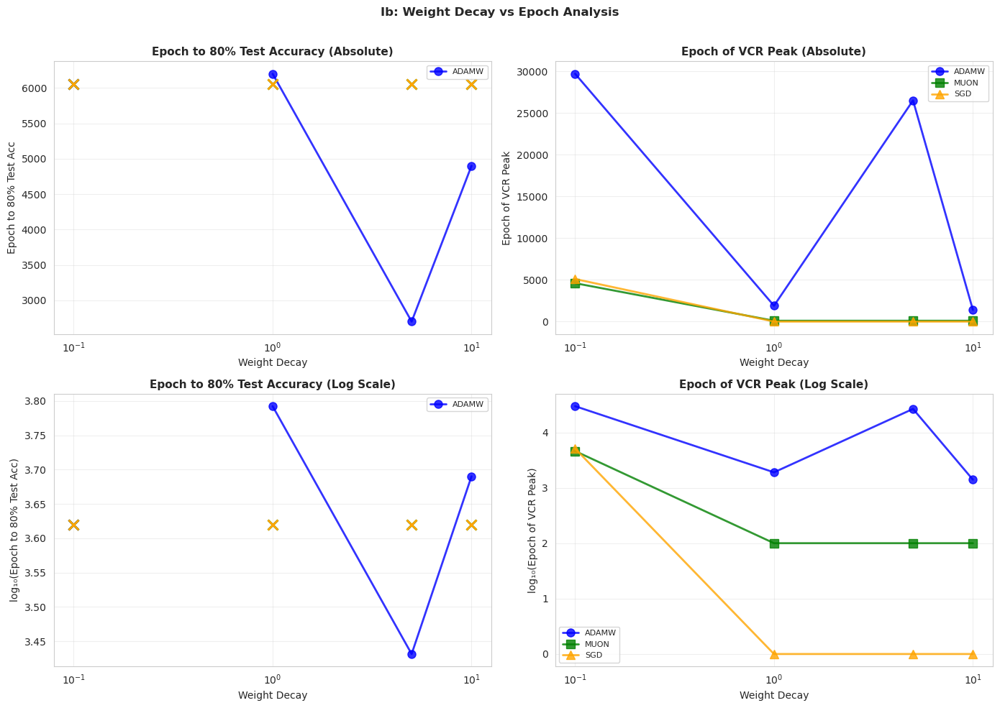

Generated: Ib_nanda_transformer_wd_epoch_analysis.png


In [13]:
# Experiment Ib: Nanda Transformer - WD vs Epoch Analysis
plot_wd_vs_epochs(
    nanda_experiments, 'transformer', [0.1, 1.0, 5.0, 10.0], ['adamw', 'muon', 'sgd'],
    'Ib', 'nanda_transformer'
)


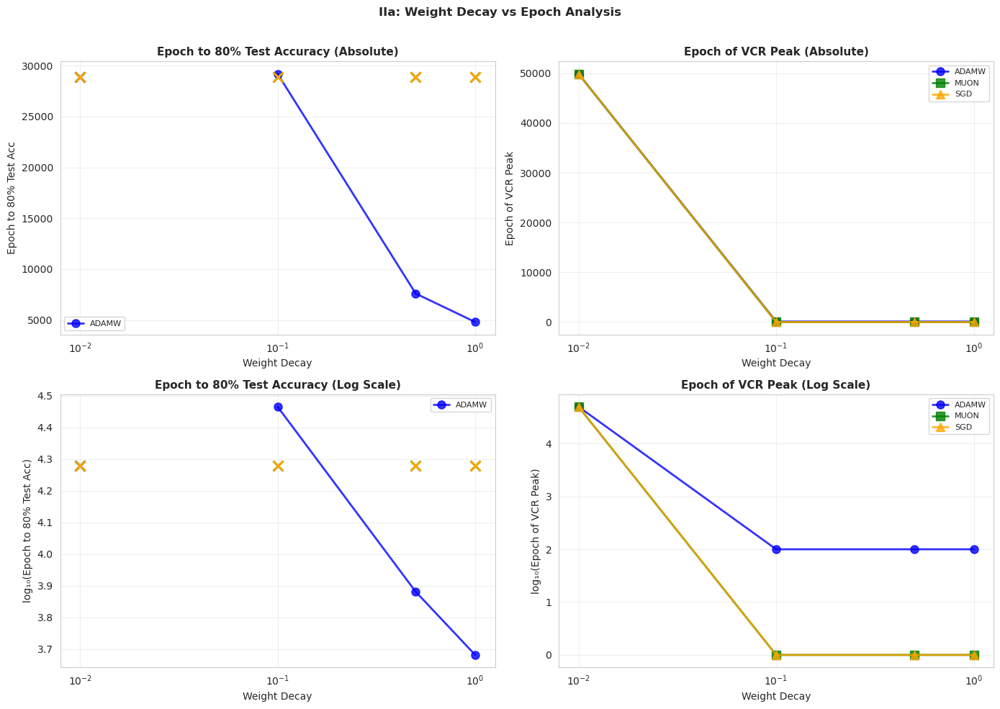

Generated: IIa_softmax_mlp_wd_epoch_analysis.png


In [14]:
# Experiment IIa: Softmax MLP - WD vs Epoch Analysis
plot_wd_vs_epochs(
    softmax_experiments, 'mlp', [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'IIa', 'softmax_mlp'
)


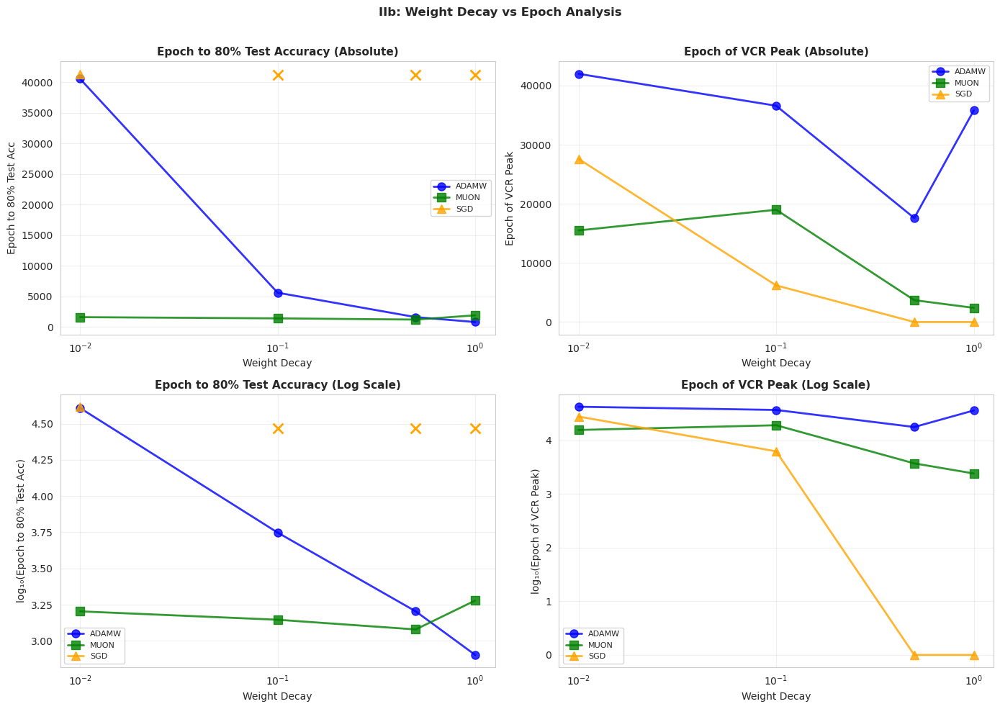

Generated: IIb_softmax_transformer_wd_epoch_analysis.png


In [15]:
# Experiment IIb: Softmax Transformer - WD vs Epoch Analysis
plot_wd_vs_epochs(
    softmax_experiments, 'transformer', [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'IIb', 'softmax_transformer'
)


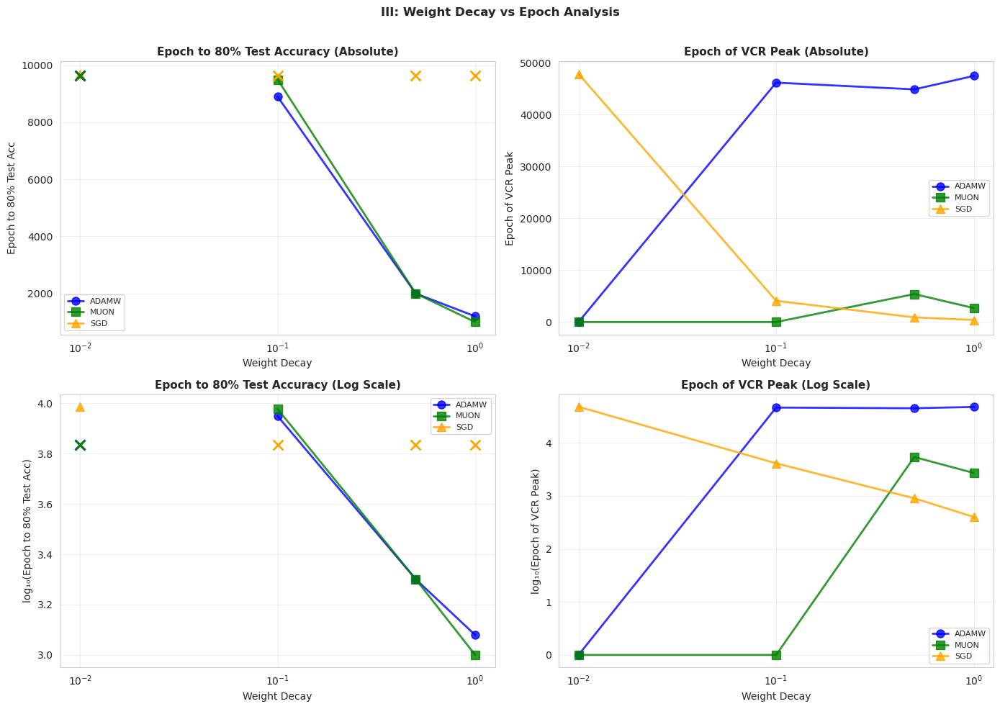

Generated: III_mnist_wd_epoch_analysis.png


In [16]:
# Experiment III: MNIST - WD vs Epoch Analysis
plot_wd_vs_epochs(
    mnist_experiments, None, [0.01, 0.1, 0.5, 1.0], ['adamw', 'muon', 'sgd'],
    'III', 'mnist',
    architecture_field=False
)


In [17]:
print("="*80)
print("WEIGHT DECAY vs EPOCH ANALYSIS COMPLETE")
print("="*80)
print(f"\nGenerated 5 WD vs Epoch figures:")
print(f"  - Ia_nanda_mlp_wd_epoch_analysis.png")
print(f"  - Ib_nanda_transformer_wd_epoch_analysis.png")
print(f"  - IIa_softmax_mlp_wd_epoch_analysis.png")
print(f"  - IIb_softmax_transformer_wd_epoch_analysis.png")
print(f"  - III_mnist_wd_epoch_analysis.png")
print("="*80)


WEIGHT DECAY vs EPOCH ANALYSIS COMPLETE

Generated 5 WD vs Epoch figures:
  - Ia_nanda_mlp_wd_epoch_analysis.png
  - Ib_nanda_transformer_wd_epoch_analysis.png
  - IIa_softmax_mlp_wd_epoch_analysis.png
  - IIb_softmax_transformer_wd_epoch_analysis.png
  - III_mnist_wd_epoch_analysis.png


---
# Summary: Epoch to 80% Test Accuracy Across All Experiments

A single 3x2 panel comparing when models achieve 80% test accuracy across different weight decays and optimizers for all 5 experiments.


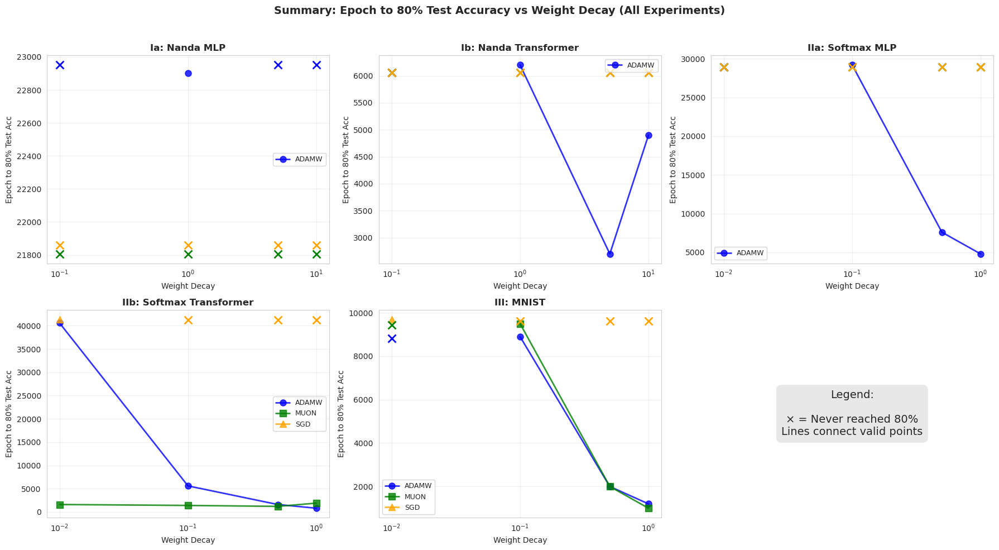

Generated: summary_epoch_to_80_all_experiments.png


In [18]:
# Summary Panel: Epoch to 80% Test Accuracy for All Experiments

# Define all experiments
experiments_config = [
    ('Ia: Nanda MLP', nanda_experiments, 'mlp', [0.1, 1.0, 5.0, 10.0], True),
    ('Ib: Nanda Transformer', nanda_experiments, 'transformer', [0.1, 1.0, 5.0, 10.0], True),
    ('IIa: Softmax MLP', softmax_experiments, 'mlp', [0.01, 0.1, 0.5, 1.0], True),
    ('IIb: Softmax Transformer', softmax_experiments, 'transformer', [0.01, 0.1, 0.5, 1.0], True),
    ('III: MNIST', mnist_experiments, None, [0.01, 0.1, 0.5, 1.0], False),
]

optimizers = ['adamw', 'muon', 'sgd']
colors = {'adamw': 'blue', 'muon': 'green', 'sgd': 'orange'}
markers = {'adamw': 'o', 'muon': 's', 'sgd': '^'}

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, (exp_label, experiments, arch, weight_decays, arch_field) in enumerate(experiments_config):
    ax = axes[idx]
    
    # Get epoch metrics for this experiment
    results = get_epoch_metrics(experiments, arch, weight_decays, optimizers, architecture_field=arch_field)
    
    for opt in optimizers:
        valid_wd = []
        valid_epoch = []
        invalid_wd = []
        
        for wd in weight_decays:
            epoch_val = results[opt][wd]['test_80_epoch']
            if epoch_val is not None:
                valid_wd.append(wd)
                valid_epoch.append(epoch_val)
            else:
                invalid_wd.append(wd)
        
        # Plot valid points with lines
        if len(valid_wd) > 0:
            ax.plot(valid_wd, valid_epoch, color=colors[opt], marker=markers[opt], 
                   linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
        
        # Plot invalid points as 'x' at top
        if len(invalid_wd) > 0:
            y_max = ax.get_ylim()[1] if ax.get_ylim()[1] > 0 else 50000
            ax.scatter(invalid_wd, [y_max * 0.95] * len(invalid_wd), color=colors[opt], 
                      marker='x', s=100, linewidths=2, zorder=5)
    
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('Epoch to 80% Test Acc', fontsize=10)
    ax.set_title(exp_label, fontsize=12, fontweight='bold')
    ax.legend(fontsize=9, loc='best')
    ax.grid(alpha=0.3)
    ax.set_xscale('log')

# Hide the 6th subplot (empty)
axes[5].axis('off')
axes[5].text(0.5, 0.5, 'Legend:\n\n× = Never reached 80%\nLines connect valid points', 
            transform=axes[5].transAxes, ha='center', va='center', fontsize=14,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgray', alpha=0.5))

fig.suptitle('Summary: Epoch to 80% Test Accuracy vs Weight Decay (All Experiments)', 
            fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(FIGURES_DIR / 'summary_epoch_to_80_all_experiments.png', dpi=300, bbox_inches='tight')
plt.show()
print("Generated: summary_epoch_to_80_all_experiments.png")


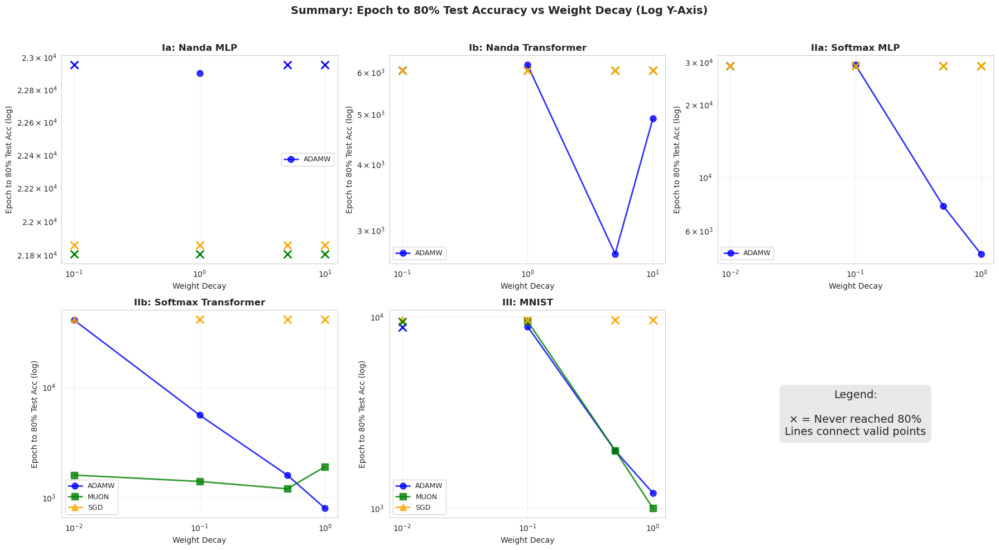

Generated: summary_epoch_to_80_all_experiments_log.png


In [19]:
# Summary Panel: Epoch to 80% Test Accuracy for All Experiments (LOG Y-AXIS)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, (exp_label, experiments, arch, weight_decays, arch_field) in enumerate(experiments_config):
    ax = axes[idx]
    
    # Get epoch metrics for this experiment
    results = get_epoch_metrics(experiments, arch, weight_decays, optimizers, architecture_field=arch_field)
    
    for opt in optimizers:
        valid_wd = []
        valid_epoch = []
        invalid_wd = []
        
        for wd in weight_decays:
            epoch_val = results[opt][wd]['test_80_epoch']
            if epoch_val is not None:
                valid_wd.append(wd)
                valid_epoch.append(epoch_val)
            else:
                invalid_wd.append(wd)
        
        # Plot valid points with lines
        if len(valid_wd) > 0:
            ax.plot(valid_wd, valid_epoch, color=colors[opt], marker=markers[opt], 
                   linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
        
        # Plot invalid points as 'x' at top
        if len(invalid_wd) > 0:
            y_max = ax.get_ylim()[1] if ax.get_ylim()[1] > 0 else 50000
            ax.scatter(invalid_wd, [y_max * 0.95] * len(invalid_wd), color=colors[opt], 
                      marker='x', s=100, linewidths=2, zorder=5)
    
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('Epoch to 80% Test Acc (log)', fontsize=10)
    ax.set_title(exp_label, fontsize=12, fontweight='bold')
    ax.legend(fontsize=9, loc='best')
    ax.grid(alpha=0.3)
    ax.set_xscale('log')
    ax.set_yscale('log')  # LOG SCALE ON Y-AXIS

# Hide the 6th subplot (empty)
axes[5].axis('off')
axes[5].text(0.5, 0.5, 'Legend:\n\n× = Never reached 80%\nLines connect valid points', 
            transform=axes[5].transAxes, ha='center', va='center', fontsize=14,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgray', alpha=0.5))

fig.suptitle('Summary: Epoch to 80% Test Accuracy vs Weight Decay (Log Y-Axis)', 
            fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(FIGURES_DIR / 'summary_epoch_to_80_all_experiments_log.png', dpi=300, bbox_inches='tight')
plt.show()
print("Generated: summary_epoch_to_80_all_experiments_log.png")


In [20]:
print("="*80)
print("FINAL PRESENTATION ANALYSIS - ALL COMPLETE")
print("="*80)
print(f"\nTOTAL: 16 figures generated")
print(f"  - 5 Training Dynamics panels (4×3 grid each)")
print(f"  - 5 VCR Analysis panels (4×3 grid each)")
print(f"  - 5 WD vs Epoch Analysis panels (2×2 grid each)")
print(f"  - 1 Summary panel (all experiments)")
print(f"\nAll figures saved to: {FIGURES_DIR.absolute()}")
print("="*80)


FINAL PRESENTATION ANALYSIS - ALL COMPLETE

TOTAL: 16 figures generated
  - 5 Training Dynamics panels (4×3 grid each)
  - 5 VCR Analysis panels (4×3 grid each)
  - 5 WD vs Epoch Analysis panels (2×2 grid each)
  - 1 Summary panel (all experiments)

All figures saved to: /net/vast-storage/scratch/vast/lhtsai/mabdel03/files/Classes/9.520/9.520-The-Geometry-of-Grok/New_Explorations/agop_experiments/analysis/figures/final


---
# NTK Alignment and Weight Norm Analysis (Extended Weight Decay Sweep)

This section analyzes **NTK distance** and **weight norm evolution** across the newly run experiments with a wider array of weight decays.

## Metrics Analyzed
- **NTK Distance**: `||K_t - K_0||_F / ||K_0||_F` — Normalized distance of the Neural Tangent Kernel from initialization
  - Values near 0 indicate "lazy" training (kernel regime)
  - Increasing values indicate transition to "rich" training (feature learning)
- **Weight Norm**: `||θ_t||_2` — Total L2 norm of model parameters
  - Kumar et al. (2024) showed weight norm increases during lazy→rich transition

## Experiments Analyzed
| Dataset | Architectures | Weight Decays | Optimizers |
|---------|--------------|---------------|------------|
| Nanda (Modular Addition) | MLP, Transformer | 0.0, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0 | AdamW, Muon, SGD |
| Softmax (Modular Addition) | MLP, Transformer | 0.0, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0 | AdamW, Muon, SGD |
| MNIST | MLP | 0.0, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0 | AdamW, Muon, SGD |

Reference: Kumar et al. (2024) "Grokking as the Transition from Lazy to Rich Training Dynamics"


In [21]:
# Load Extended Weight Decay Sweep Experiments
print("Loading extended weight decay sweep experiments...")

NANDA_WD_SWEEP_DIR = Path('../results/nanda_wd_sweep')
SOFTMAX_WD_SWEEP_DIR = Path('../results/softmax_wd_sweep')
MNIST_WD_SWEEP_DIR = Path('../results/mnist_wd_sweep')

nanda_wd_sweep = load_all_experiments(NANDA_WD_SWEEP_DIR)
softmax_wd_sweep = load_all_experiments(SOFTMAX_WD_SWEEP_DIR)
mnist_wd_sweep = load_all_experiments(MNIST_WD_SWEEP_DIR)

print(f"  Nanda WD Sweep: {len(nanda_wd_sweep)} experiments")
print(f"  Softmax WD Sweep: {len(softmax_wd_sweep)} experiments")
print(f"  MNIST WD Sweep: {len(mnist_wd_sweep)} experiments")

# Extended weight decay values
WD_SWEEP_VALUES = [0.0, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
OPTIMIZERS = ['adamw', 'muon', 'sgd']

print(f"\nWeight decays analyzed: {WD_SWEEP_VALUES}")
print("Done!")


Loading extended weight decay sweep experiments...
  Nanda WD Sweep: 54 experiments
  Softmax WD Sweep: 49 experiments
  MNIST WD Sweep: 27 experiments

Weight decays analyzed: [0.0, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
Done!


In [22]:
# Helper functions for NTK and Weight Norm Analysis

def get_wd_sweep_experiment(experiments, architecture, optimizer, weight_decay):
    """Find experiment matching the given configuration in WD sweep data."""
    for name, data in experiments.items():
        config = data['config']
        if architecture is not None and config.get('architecture') != architecture:
            continue
        if config.get('optimizer') != optimizer:
            continue
        if abs(config.get('weight_decay', -1) - weight_decay) > 0.001:
            continue
        return data
    return None


def plot_ntk_weight_norm_dynamics(experiments, arch, weight_decays, optimizers, title, save_name, 
                                   architecture_field=True):
    """
    Generate NTK distance and weight norm dynamics panel.
    Layout: rows = weight decays, columns = optimizers
    Each subplot shows NTK distance (blue) and weight norm (green) with test accuracy overlay (orange dashed).
    """
    n_wd = len(weight_decays)
    n_opt = len(optimizers)
    
    fig, axes = plt.subplots(n_wd, n_opt, figsize=(6*n_opt, 4*n_wd))
    if n_wd == 1:
        axes = axes.reshape(1, -1)
    if n_opt == 1:
        axes = axes.reshape(-1, 1)
    
    for wd_idx, wd in enumerate(weight_decays):
        for opt_idx, opt in enumerate(optimizers):
            ax = axes[wd_idx, opt_idx]
            
            if architecture_field:
                exp_data = get_wd_sweep_experiment(experiments, arch, opt, wd)
            else:
                exp_data = get_wd_sweep_experiment(experiments, None, opt, wd)
            
            if exp_data is None:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10)
                continue
            
            lazy_rich = exp_data.get('lazy_rich', {})
            history = exp_data.get('history', {})
            
            # Check for lazy-rich metrics
            if 'ntk_distance' not in lazy_rich or 'weight_norm_total' not in lazy_rich:
                ax.text(0.5, 0.5, 'No lazy-rich data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10)
                continue
            
            lr_epochs = np.array(lazy_rich.get('epoch', []))
            ntk_dist = np.array(lazy_rich['ntk_distance'])
            weight_norm = np.array(lazy_rich['weight_norm_total'])
            
            # Align lengths
            min_len = min(len(lr_epochs), len(ntk_dist), len(weight_norm))
            lr_epochs = lr_epochs[:min_len]
            ntk_dist = ntk_dist[:min_len]
            weight_norm = weight_norm[:min_len]
            
            # Normalize for plotting
            ntk_norm = normalize_series(ntk_dist)
            wn_norm = normalize_series(weight_norm)
            
            # Get test accuracy
            test_acc = np.array(history.get('test_acc', []))
            acc_epochs = np.array(history.get('epoch', range(len(test_acc))))
            
            # Find grok epoch
            test_80_epoch = find_test_80_epoch(test_acc, acc_epochs) if len(test_acc) > 0 else None
            
            # Plot
            ax.plot(lr_epochs, ntk_norm, linewidth=2, color='blue', alpha=0.8, label='NTK Dist (norm)')
            ax.plot(lr_epochs, wn_norm, linewidth=2, color='green', alpha=0.8, label='Weight Norm (norm)')
            
            # Overlay test accuracy
            if len(test_acc) > 0:
                ax.plot(acc_epochs, test_acc, linewidth=1.5, color='orange', alpha=0.5, 
                       linestyle='--', label='Test Acc')
            
            # Mark grok epoch
            if test_80_epoch is not None:
                ax.axvline(x=test_80_epoch, color='red', linestyle='--', linewidth=2, alpha=0.7)
                ax.text(0.98, 0.15, f'Grok: {int(test_80_epoch)}', transform=ax.transAxes,
                       fontsize=9, fontweight='bold', color='red', ha='right', va='bottom',
                       bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8, edgecolor='red'))
                status_color = 'green'
            else:
                status_color = 'darkred'
            
            ax.set_title(f'{opt.upper()} | WD={wd}', fontsize=10, fontweight='bold', color=status_color)
            ax.grid(alpha=0.3, linestyle='--')
            ax.set_ylim([-0.05, 1.05])
            
            if wd_idx == n_wd - 1:
                ax.set_xlabel('Epoch', fontsize=9)
            if opt_idx == 0:
                ax.set_ylabel('Normalized Value', fontsize=9)
            if wd_idx == 0 and opt_idx == 0:
                ax.legend(fontsize=7, loc='upper left')
    
    fig.suptitle(title, fontsize=12, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(FIGURES_DIR / save_name, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Generated: {save_name}")


def plot_ntk_vs_weight_decay(experiments, arch, weight_decays, optimizers, exp_label, exp_name,
                              architecture_field=True):
    """
    Generate 2x2 panel showing NTK distance and weight norm vs weight decay.
    Top row: Final values
    Bottom row: Max values during training
    """
    colors = {'adamw': 'blue', 'muon': 'green', 'sgd': 'orange'}
    markers = {'adamw': 'o', 'muon': 's', 'sgd': '^'}
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    for opt in optimizers:
        final_ntk = []
        max_ntk = []
        final_wn = []
        wn_ratio = []
        valid_wd = []
        
        for wd in weight_decays:
            if architecture_field:
                exp_data = get_wd_sweep_experiment(experiments, arch, opt, wd)
            else:
                exp_data = get_wd_sweep_experiment(experiments, None, opt, wd)
            
            if exp_data is None:
                continue
            
            lazy_rich = exp_data.get('lazy_rich', {})
            
            if 'ntk_distance' not in lazy_rich or 'weight_norm_total' not in lazy_rich:
                continue
            
            ntk_dist = np.array(lazy_rich['ntk_distance'])
            weight_norm = np.array(lazy_rich['weight_norm_total'])
            
            if len(ntk_dist) == 0 or len(weight_norm) == 0:
                continue
            
            valid_wd.append(wd)
            final_ntk.append(ntk_dist[-1])
            max_ntk.append(np.max(ntk_dist))
            final_wn.append(weight_norm[-1])
            wn_ratio.append(weight_norm[-1] / (weight_norm[0] + 1e-10))
        
        if len(valid_wd) == 0:
            continue
        
        # Top-left: Final NTK distance vs WD
        axes[0, 0].plot(valid_wd, final_ntk, color=colors[opt], marker=markers[opt],
                       linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
        
        # Top-right: Final weight norm vs WD  
        axes[0, 1].plot(valid_wd, final_wn, color=colors[opt], marker=markers[opt],
                       linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
        
        # Bottom-left: Max NTK distance vs WD
        axes[1, 0].plot(valid_wd, max_ntk, color=colors[opt], marker=markers[opt],
                       linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
        
        # Bottom-right: Weight norm ratio vs WD
        axes[1, 1].plot(valid_wd, wn_ratio, color=colors[opt], marker=markers[opt],
                       linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
    
    # Configure axes
    for ax in axes.flat:
        ax.set_xscale('log')
        ax.grid(alpha=0.3)
        ax.legend(fontsize=9)
    
    axes[0, 0].set_xlabel('Weight Decay', fontsize=10)
    axes[0, 0].set_ylabel('Final NTK Distance', fontsize=10)
    axes[0, 0].set_title('Final NTK Distance vs Weight Decay', fontsize=11, fontweight='bold')
    
    axes[0, 1].set_xlabel('Weight Decay', fontsize=10)
    axes[0, 1].set_ylabel('Final Weight Norm', fontsize=10)
    axes[0, 1].set_title('Final Weight Norm vs Weight Decay', fontsize=11, fontweight='bold')
    
    axes[1, 0].set_xlabel('Weight Decay', fontsize=10)
    axes[1, 0].set_ylabel('Max NTK Distance', fontsize=10)
    axes[1, 0].set_title('Max NTK Distance vs Weight Decay', fontsize=11, fontweight='bold')
    
    axes[1, 1].set_xlabel('Weight Decay', fontsize=10)
    axes[1, 1].set_ylabel('Weight Norm Ratio (Final/Initial)', fontsize=10)
    axes[1, 1].set_title('Weight Norm Change vs Weight Decay', fontsize=11, fontweight='bold')
    
    fig.suptitle(f'{exp_label}: NTK & Weight Norm vs Weight Decay', fontsize=12, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    save_file = f'{exp_label}_{exp_name}_ntk_wn_vs_wd.png'
    plt.savefig(FIGURES_DIR / save_file, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Generated: {save_file}")

print("NTK/Weight Norm helper functions loaded.")


NTK/Weight Norm helper functions loaded.


---
## Experiment Ia (WD Sweep): Nanda MLP - NTK & Weight Norm Analysis


Experiment Ia (WD Sweep): Nanda MLP - NTK & Weight Norm Analysis


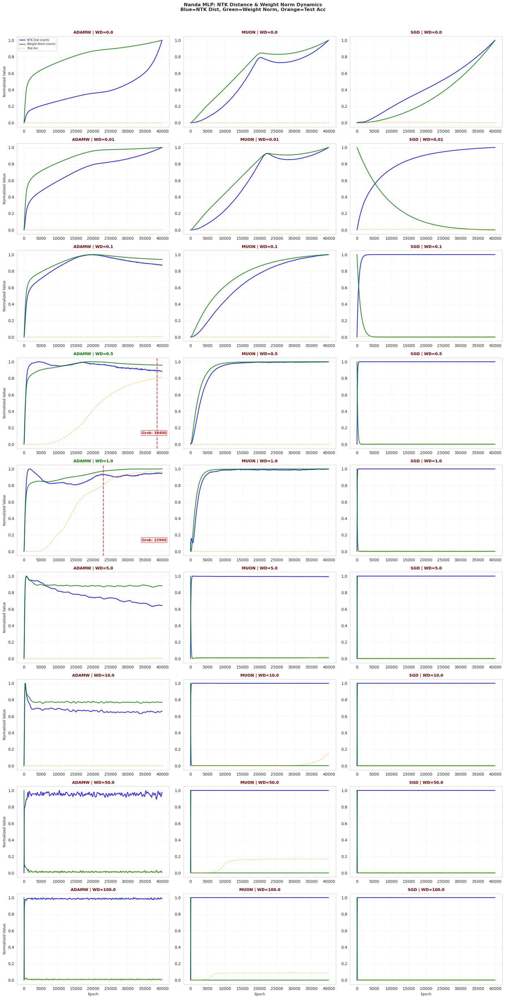

Generated: Ia_sweep_nanda_mlp_ntk_wn_dynamics.png


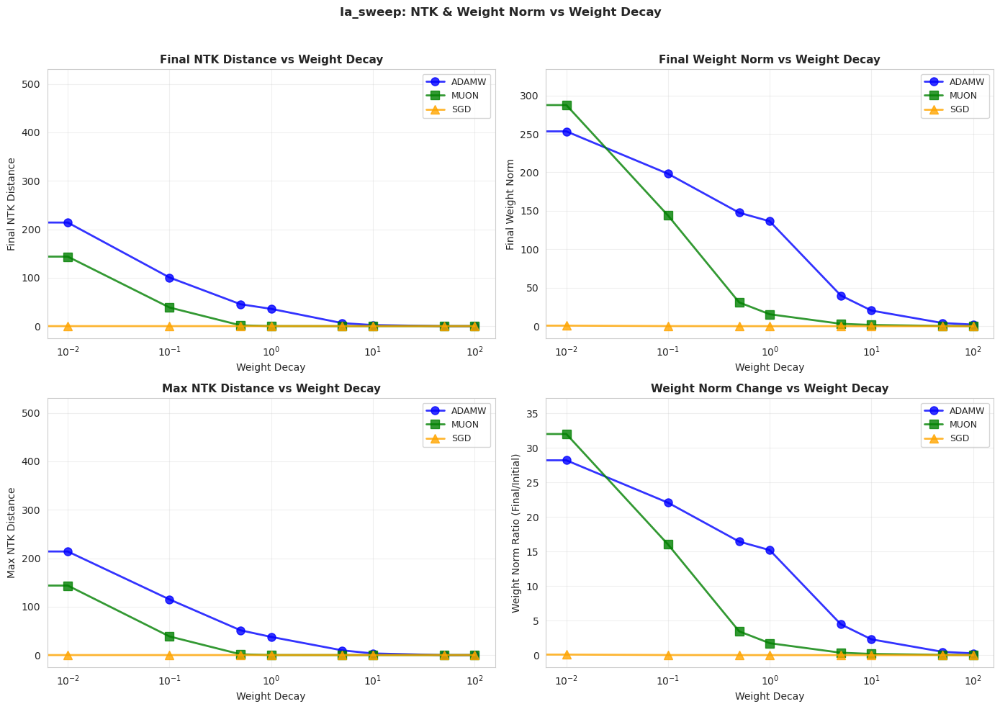

Generated: Ia_sweep_nanda_mlp_ntk_wn_vs_wd.png


In [23]:
# Experiment Ia (WD Sweep): Nanda MLP - NTK & Weight Norm Dynamics
print("="*80)
print("Experiment Ia (WD Sweep): Nanda MLP - NTK & Weight Norm Analysis")
print("="*80)

# NTK and Weight Norm dynamics over training
plot_ntk_weight_norm_dynamics(
    nanda_wd_sweep, 'mlp', WD_SWEEP_VALUES, OPTIMIZERS,
    'Nanda MLP: NTK Distance & Weight Norm Dynamics\nBlue=NTK Dist, Green=Weight Norm, Orange=Test Acc',
    'Ia_sweep_nanda_mlp_ntk_wn_dynamics.png',
    architecture_field=True
)

# NTK and Weight Norm vs Weight Decay summary
plot_ntk_vs_weight_decay(
    nanda_wd_sweep, 'mlp', WD_SWEEP_VALUES, OPTIMIZERS,
    'Ia_sweep', 'nanda_mlp',
    architecture_field=True
)


---
## Experiment Ib (WD Sweep): Nanda Transformer - NTK & Weight Norm Analysis


Experiment Ib (WD Sweep): Nanda Transformer - NTK & Weight Norm Analysis


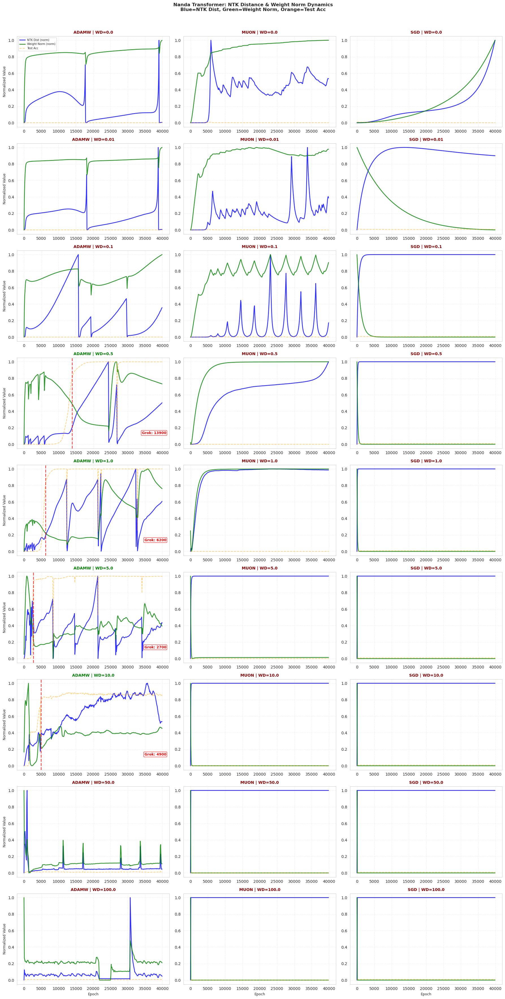

Generated: Ib_sweep_nanda_transformer_ntk_wn_dynamics.png


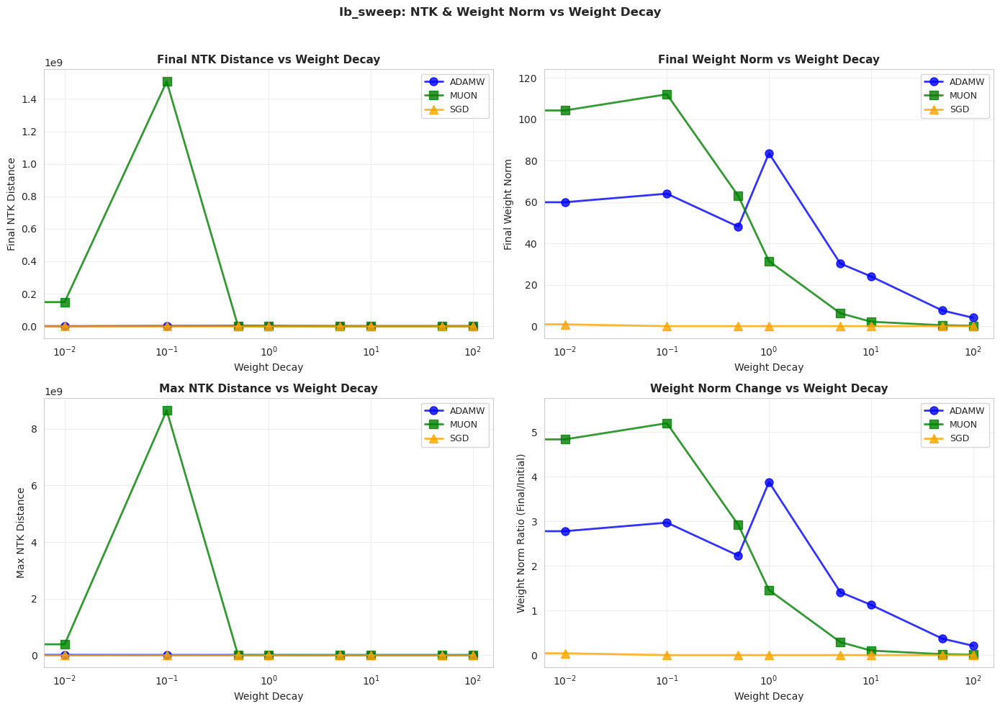

Generated: Ib_sweep_nanda_transformer_ntk_wn_vs_wd.png


In [24]:
# Experiment Ib (WD Sweep): Nanda Transformer - NTK & Weight Norm Dynamics
print("="*80)
print("Experiment Ib (WD Sweep): Nanda Transformer - NTK & Weight Norm Analysis")
print("="*80)

# NTK and Weight Norm dynamics over training
plot_ntk_weight_norm_dynamics(
    nanda_wd_sweep, 'transformer', WD_SWEEP_VALUES, OPTIMIZERS,
    'Nanda Transformer: NTK Distance & Weight Norm Dynamics\nBlue=NTK Dist, Green=Weight Norm, Orange=Test Acc',
    'Ib_sweep_nanda_transformer_ntk_wn_dynamics.png',
    architecture_field=True
)

# NTK and Weight Norm vs Weight Decay summary
plot_ntk_vs_weight_decay(
    nanda_wd_sweep, 'transformer', WD_SWEEP_VALUES, OPTIMIZERS,
    'Ib_sweep', 'nanda_transformer',
    architecture_field=True
)


---
## Experiment IIa (WD Sweep): Softmax MLP - NTK & Weight Norm Analysis


Experiment IIa (WD Sweep): Softmax MLP - NTK & Weight Norm Analysis


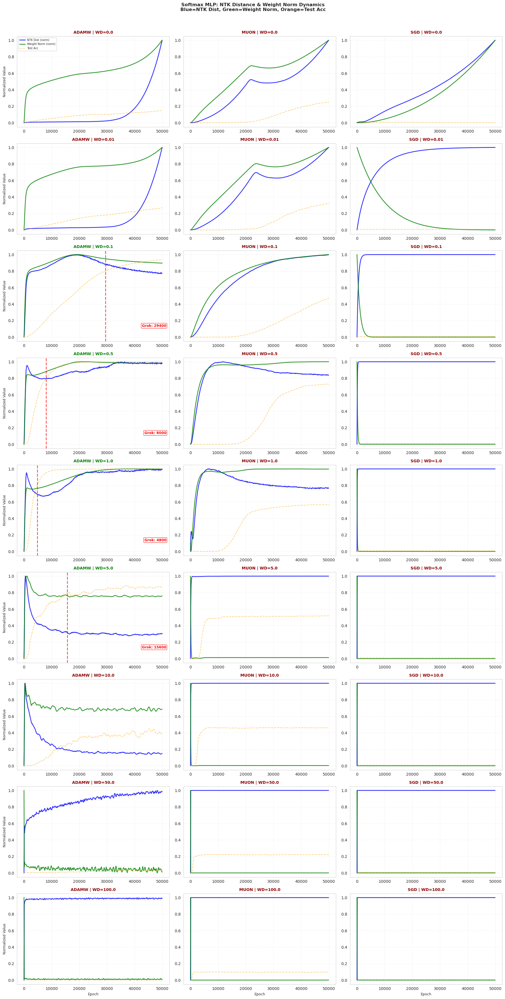

Generated: IIa_sweep_softmax_mlp_ntk_wn_dynamics.png


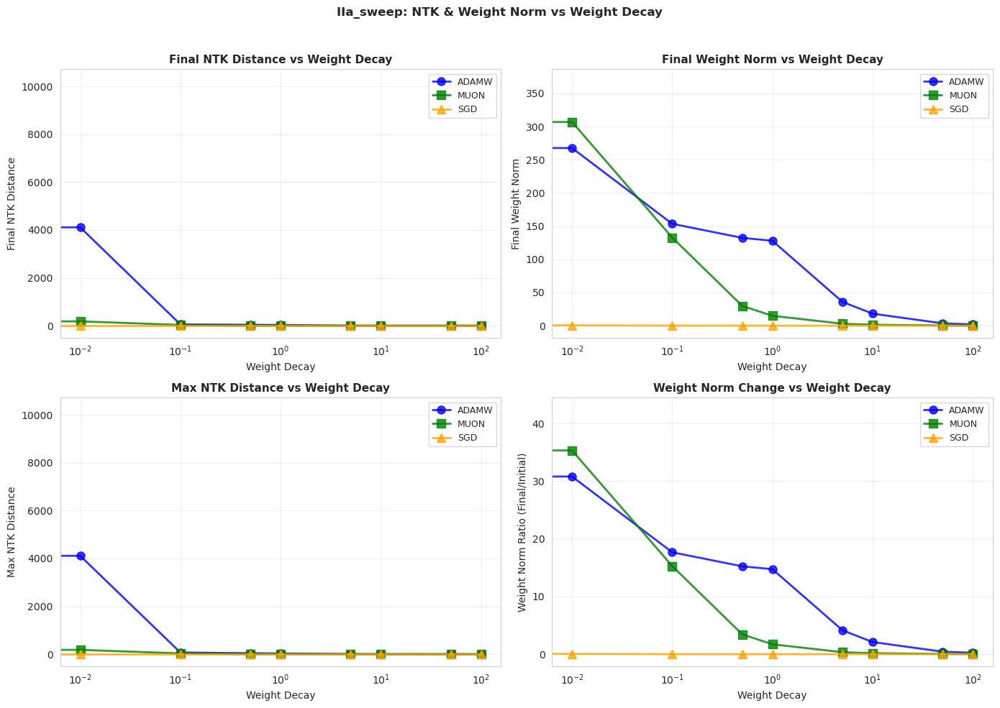

Generated: IIa_sweep_softmax_mlp_ntk_wn_vs_wd.png


In [25]:
# Experiment IIa (WD Sweep): Softmax MLP - NTK & Weight Norm Dynamics
print("="*80)
print("Experiment IIa (WD Sweep): Softmax MLP - NTK & Weight Norm Analysis")
print("="*80)

# NTK and Weight Norm dynamics over training
plot_ntk_weight_norm_dynamics(
    softmax_wd_sweep, 'mlp', WD_SWEEP_VALUES, OPTIMIZERS,
    'Softmax MLP: NTK Distance & Weight Norm Dynamics\nBlue=NTK Dist, Green=Weight Norm, Orange=Test Acc',
    'IIa_sweep_softmax_mlp_ntk_wn_dynamics.png',
    architecture_field=True
)

# NTK and Weight Norm vs Weight Decay summary
plot_ntk_vs_weight_decay(
    softmax_wd_sweep, 'mlp', WD_SWEEP_VALUES, OPTIMIZERS,
    'IIa_sweep', 'softmax_mlp',
    architecture_field=True
)


---
## Experiment IIb (WD Sweep): Softmax Transformer - NTK & Weight Norm Analysis


Experiment IIb (WD Sweep): Softmax Transformer - NTK & Weight Norm Analysis


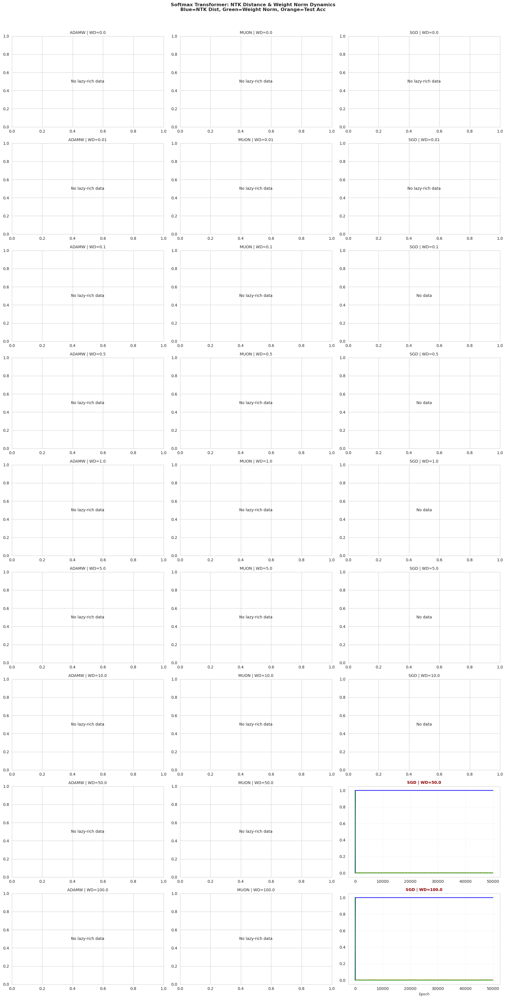

Generated: IIb_sweep_softmax_transformer_ntk_wn_dynamics.png


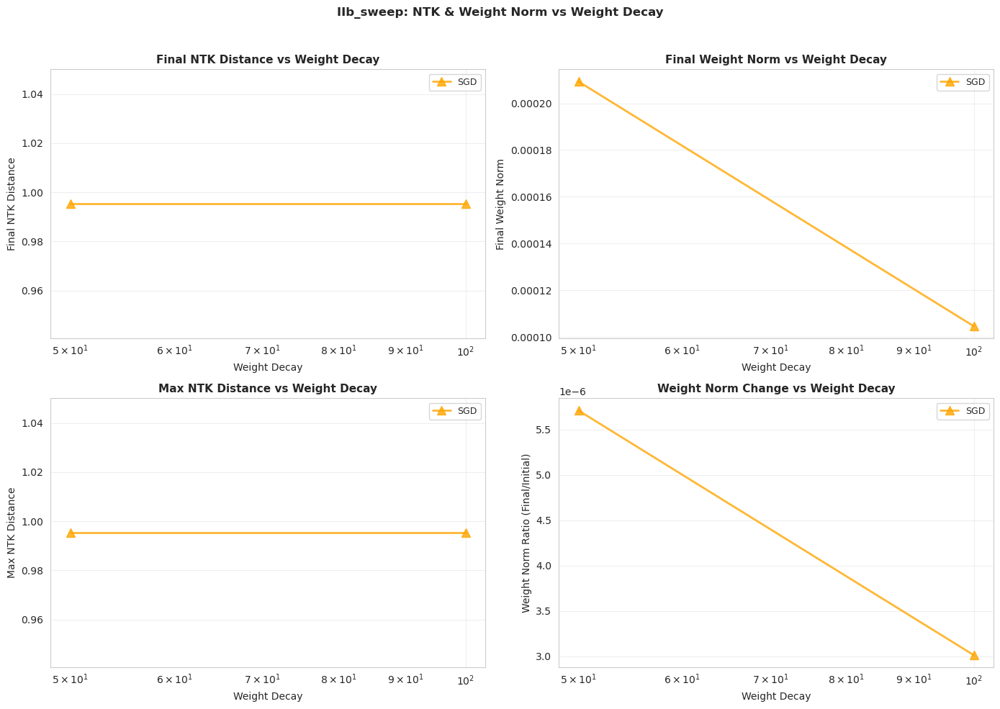

Generated: IIb_sweep_softmax_transformer_ntk_wn_vs_wd.png


In [26]:
# Experiment IIb (WD Sweep): Softmax Transformer - NTK & Weight Norm Dynamics
print("="*80)
print("Experiment IIb (WD Sweep): Softmax Transformer - NTK & Weight Norm Analysis")
print("="*80)

# NTK and Weight Norm dynamics over training
plot_ntk_weight_norm_dynamics(
    softmax_wd_sweep, 'transformer', WD_SWEEP_VALUES, OPTIMIZERS,
    'Softmax Transformer: NTK Distance & Weight Norm Dynamics\nBlue=NTK Dist, Green=Weight Norm, Orange=Test Acc',
    'IIb_sweep_softmax_transformer_ntk_wn_dynamics.png',
    architecture_field=True
)

# NTK and Weight Norm vs Weight Decay summary
plot_ntk_vs_weight_decay(
    softmax_wd_sweep, 'transformer', WD_SWEEP_VALUES, OPTIMIZERS,
    'IIb_sweep', 'softmax_transformer',
    architecture_field=True
)


---
## Experiment III (WD Sweep): MNIST - NTK & Weight Norm Analysis


Experiment III (WD Sweep): MNIST - NTK & Weight Norm Analysis


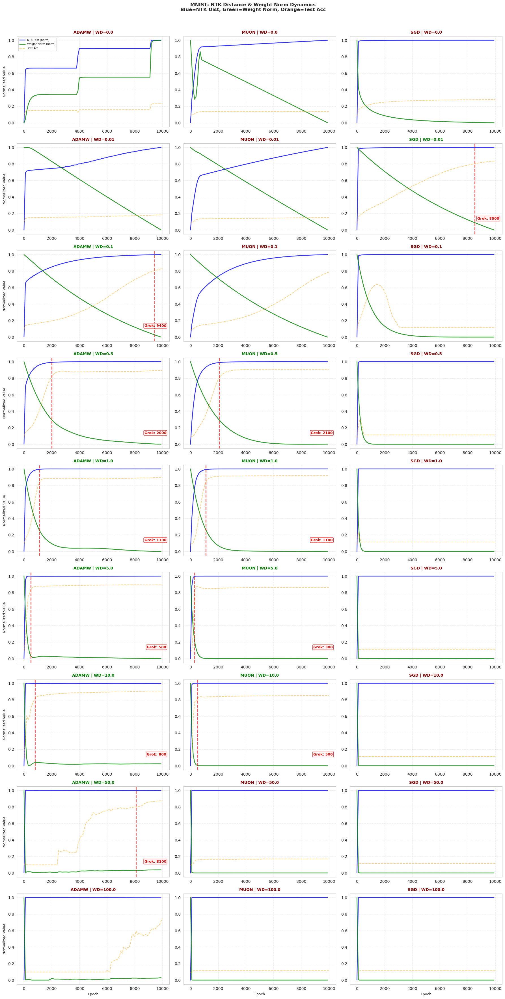

Generated: III_sweep_mnist_ntk_wn_dynamics.png


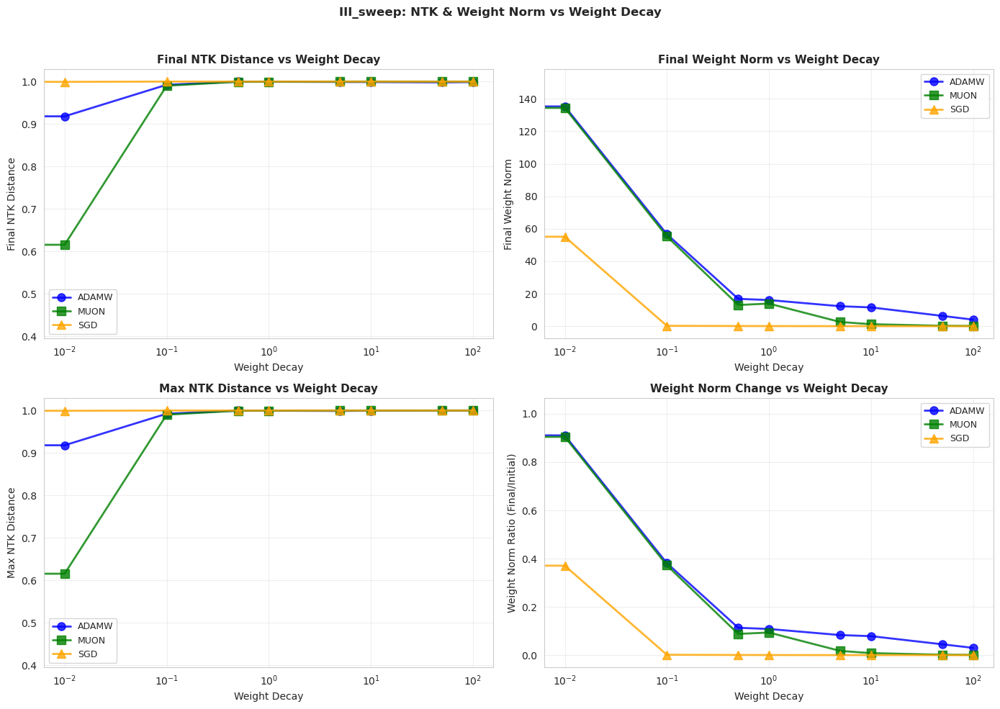

Generated: III_sweep_mnist_ntk_wn_vs_wd.png


In [27]:
# Experiment III (WD Sweep): MNIST - NTK & Weight Norm Dynamics
print("="*80)
print("Experiment III (WD Sweep): MNIST - NTK & Weight Norm Analysis")
print("="*80)

# NTK and Weight Norm dynamics over training (MNIST has no architecture field)
plot_ntk_weight_norm_dynamics(
    mnist_wd_sweep, None, WD_SWEEP_VALUES, OPTIMIZERS,
    'MNIST: NTK Distance & Weight Norm Dynamics\nBlue=NTK Dist, Green=Weight Norm, Orange=Test Acc',
    'III_sweep_mnist_ntk_wn_dynamics.png',
    architecture_field=False
)

# NTK and Weight Norm vs Weight Decay summary
plot_ntk_vs_weight_decay(
    mnist_wd_sweep, None, WD_SWEEP_VALUES, OPTIMIZERS,
    'III_sweep', 'mnist',
    architecture_field=False
)


---
## Summary: NTK Distance & Weight Norm Across All Experiments

Cross-experiment comparison of NTK distance and weight norm metrics across the extended weight decay sweep.


Summary: NTK Distance & Weight Norm vs Weight Decay (All Experiments)


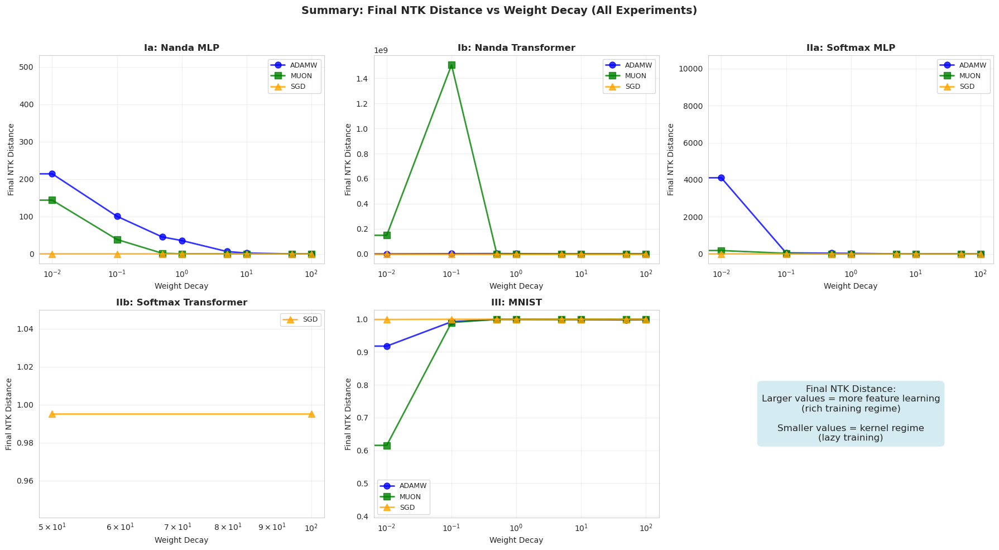

Generated: summary_ntk_distance_vs_wd_all.png


In [28]:
# Summary Panel: Final NTK Distance vs Weight Decay (All Experiments)
print("="*80)
print("Summary: NTK Distance & Weight Norm vs Weight Decay (All Experiments)")
print("="*80)

# Define all WD sweep experiments
wd_sweep_configs = [
    ('Ia: Nanda MLP', nanda_wd_sweep, 'mlp', True),
    ('Ib: Nanda Transformer', nanda_wd_sweep, 'transformer', True),
    ('IIa: Softmax MLP', softmax_wd_sweep, 'mlp', True),
    ('IIb: Softmax Transformer', softmax_wd_sweep, 'transformer', True),
    ('III: MNIST', mnist_wd_sweep, None, False),
]

colors = {'adamw': 'blue', 'muon': 'green', 'sgd': 'orange'}
markers = {'adamw': 'o', 'muon': 's', 'sgd': '^'}

# Figure 1: Final NTK Distance vs Weight Decay
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, (exp_label, experiments, arch, arch_field) in enumerate(wd_sweep_configs):
    ax = axes[idx]
    
    for opt in OPTIMIZERS:
        valid_wd = []
        final_ntk = []
        
        for wd in WD_SWEEP_VALUES:
            if arch_field:
                exp_data = get_wd_sweep_experiment(experiments, arch, opt, wd)
            else:
                exp_data = get_wd_sweep_experiment(experiments, None, opt, wd)
            
            if exp_data is None:
                continue
            
            lazy_rich = exp_data.get('lazy_rich', {})
            if 'ntk_distance' not in lazy_rich:
                continue
            
            ntk_dist = np.array(lazy_rich['ntk_distance'])
            if len(ntk_dist) == 0:
                continue
            
            valid_wd.append(wd)
            final_ntk.append(ntk_dist[-1])
        
        if len(valid_wd) > 0:
            ax.plot(valid_wd, final_ntk, color=colors[opt], marker=markers[opt],
                   linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
    
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('Final NTK Distance', fontsize=10)
    ax.set_title(exp_label, fontsize=12, fontweight='bold')
    ax.legend(fontsize=9, loc='best')
    ax.grid(alpha=0.3)
    ax.set_xscale('log')

# Hide the 6th subplot
axes[5].axis('off')
axes[5].text(0.5, 0.5, 'Final NTK Distance:\nLarger values = more feature learning\n(rich training regime)\n\nSmaller values = kernel regime\n(lazy training)', 
            transform=axes[5].transAxes, ha='center', va='center', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.5))

fig.suptitle('Summary: Final NTK Distance vs Weight Decay (All Experiments)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(FIGURES_DIR / 'summary_ntk_distance_vs_wd_all.png', dpi=300, bbox_inches='tight')
plt.show()
print("Generated: summary_ntk_distance_vs_wd_all.png")


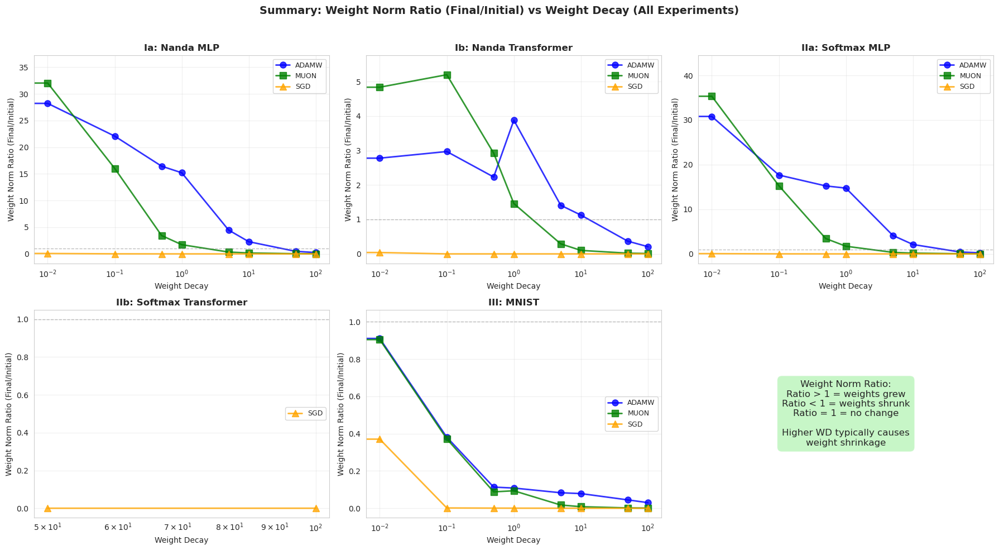

Generated: summary_weight_norm_ratio_vs_wd_all.png


In [29]:
# Summary Panel: Weight Norm Ratio vs Weight Decay (All Experiments)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, (exp_label, experiments, arch, arch_field) in enumerate(wd_sweep_configs):
    ax = axes[idx]
    
    for opt in OPTIMIZERS:
        valid_wd = []
        wn_ratio = []
        
        for wd in WD_SWEEP_VALUES:
            if arch_field:
                exp_data = get_wd_sweep_experiment(experiments, arch, opt, wd)
            else:
                exp_data = get_wd_sweep_experiment(experiments, None, opt, wd)
            
            if exp_data is None:
                continue
            
            lazy_rich = exp_data.get('lazy_rich', {})
            if 'weight_norm_total' not in lazy_rich:
                continue
            
            weight_norm = np.array(lazy_rich['weight_norm_total'])
            if len(weight_norm) == 0:
                continue
            
            valid_wd.append(wd)
            wn_ratio.append(weight_norm[-1] / (weight_norm[0] + 1e-10))
        
        if len(valid_wd) > 0:
            ax.plot(valid_wd, wn_ratio, color=colors[opt], marker=markers[opt],
                   linewidth=2, markersize=8, label=opt.upper(), alpha=0.8)
    
    ax.set_xlabel('Weight Decay', fontsize=10)
    ax.set_ylabel('Weight Norm Ratio (Final/Initial)', fontsize=10)
    ax.set_title(exp_label, fontsize=12, fontweight='bold')
    ax.legend(fontsize=9, loc='best')
    ax.grid(alpha=0.3)
    ax.set_xscale('log')
    ax.axhline(y=1.0, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Hide the 6th subplot
axes[5].axis('off')
axes[5].text(0.5, 0.5, 'Weight Norm Ratio:\nRatio > 1 = weights grew\nRatio < 1 = weights shrunk\nRatio = 1 = no change\n\nHigher WD typically causes\nweight shrinkage', 
            transform=axes[5].transAxes, ha='center', va='center', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgreen', alpha=0.5))

fig.suptitle('Summary: Weight Norm Ratio (Final/Initial) vs Weight Decay (All Experiments)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(FIGURES_DIR / 'summary_weight_norm_ratio_vs_wd_all.png', dpi=300, bbox_inches='tight')
plt.show()
print("Generated: summary_weight_norm_ratio_vs_wd_all.png")


In [30]:
print("="*80)
print("NTK ALIGNMENT & WEIGHT NORM ANALYSIS COMPLETE")
print("="*80)
print(f"\nGenerated 12 NTK/Weight Norm figures:")
print(f"\n  Per-Experiment Dynamics (5 experiments x 2 figures each = 10):")
print(f"    - Ia_sweep_nanda_mlp_ntk_wn_dynamics.png")
print(f"    - Ia_sweep_nanda_mlp_ntk_wn_vs_wd.png")
print(f"    - Ib_sweep_nanda_transformer_ntk_wn_dynamics.png")
print(f"    - Ib_sweep_nanda_transformer_ntk_wn_vs_wd.png")
print(f"    - IIa_sweep_softmax_mlp_ntk_wn_dynamics.png")
print(f"    - IIa_sweep_softmax_mlp_ntk_wn_vs_wd.png")
print(f"    - IIb_sweep_softmax_transformer_ntk_wn_dynamics.png")
print(f"    - IIb_sweep_softmax_transformer_ntk_wn_vs_wd.png")
print(f"    - III_sweep_mnist_ntk_wn_dynamics.png")
print(f"    - III_sweep_mnist_ntk_wn_vs_wd.png")
print(f"\n  Cross-Experiment Summary (2 figures):")
print(f"    - summary_ntk_distance_vs_wd_all.png")
print(f"    - summary_weight_norm_ratio_vs_wd_all.png")
print(f"\nWeight Decays Analyzed: {WD_SWEEP_VALUES}")
print(f"\nAll figures saved to: {FIGURES_DIR.absolute()}")
print("="*80)


NTK ALIGNMENT & WEIGHT NORM ANALYSIS COMPLETE

Generated 12 NTK/Weight Norm figures:

  Per-Experiment Dynamics (5 experiments x 2 figures each = 10):
    - Ia_sweep_nanda_mlp_ntk_wn_dynamics.png
    - Ia_sweep_nanda_mlp_ntk_wn_vs_wd.png
    - Ib_sweep_nanda_transformer_ntk_wn_dynamics.png
    - Ib_sweep_nanda_transformer_ntk_wn_vs_wd.png
    - IIa_sweep_softmax_mlp_ntk_wn_dynamics.png
    - IIa_sweep_softmax_mlp_ntk_wn_vs_wd.png
    - IIb_sweep_softmax_transformer_ntk_wn_dynamics.png
    - IIb_sweep_softmax_transformer_ntk_wn_vs_wd.png
    - III_sweep_mnist_ntk_wn_dynamics.png
    - III_sweep_mnist_ntk_wn_vs_wd.png

  Cross-Experiment Summary (2 figures):
    - summary_ntk_distance_vs_wd_all.png
    - summary_weight_norm_ratio_vs_wd_all.png

Weight Decays Analyzed: [0.0, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]

All figures saved to: /net/vast-storage/scratch/vast/lhtsai/mabdel03/files/Classes/9.520/9.520-The-Geometry-of-Grok/New_Explorations/agop_experiments/analysis/figures/fina